<a href="https://colab.research.google.com/github/lax-17/Fmri-to-image/blob/main/cSAGAN_with_LSGAN_(N%3D1024_PCA).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Baseline GAN model for assessment

**Module:** Deep Neural Networks and Learning Systems

In this demonstration and notebook, we will develop a baseline model for your assessment task.


---


**Objectives:**

- Develop the baseline convolutional GAN
- Understand the potential modifications to this model to be performed as an assessment

## Setting up the dataset

The dataset is located in a different drive (public). Therefore, we need to add a shortcut to the data directory in our own drive.

**Original dataset**

Open the dataset external drive: [https://drive.google.com/drive/folders/1DUf3nGNNFk6YjRjQtZPfAY5N105GoGJb](https://drive.google.com/drive/folders/1DUf3nGNNFk6YjRjQtZPfAY5N105GoGJb) and click in add shortcut.


## Utility functions

The following functions can be used to load the FMRI data from a given subject, load activity from a given region of interest or loading the corresponding image.

In [ ]:
# Core libraries
import os, glob, joblib, shutil
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from sklearn.decomposition import PCA
from tqdm.notebook import tqdm

import time
import random
import imageio
import re

# PyTorch related
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import torchvision.utils as vutils # For saving image grids
import torch.nn.functional as F


# Check device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda:0


In [ ]:
# !pip install kaggle==1.5.16
# !mkdir -p ~/.kaggle
# !cp kaggle.json ~/.kaggle/
# !echo '{"username":"laxmikantnishad","key":"8df23e284cea717789d6c9775e0da3ae"}' > ~/.kaggle/kaggle.json
# !chmod 600 ~/.kaggle/kaggle.json

# # dataset_id = "7a4880a36f3b8e660fe64c4607b6c57de1801d9ecd9f39ad5eac42477f364823" # Example

# !kaggle datasets download -d laxmikantnishad/algonauts-2023-tutorial-data
!unzip /content/algonauts-2023-tutorial-data.zip -d /content/algonauts_2023_tutorial_data

Streaming output truncated to the last 5000 lines.
  inflating: /content/algonauts_2023_tutorial_data/algonauts_2023_tutorial_Data/subj01/training_split/training_images/train-4842_nsd-36093.png  
  inflating: /content/algonauts_2023_tutorial_data/algonauts_2023_tutorial_Data/subj01/training_split/training_images/train-4843_nsd-36095.png  
  inflating: /content/algonauts_2023_tutorial_data/algonauts_2023_tutorial_Data/subj01/training_split/training_images/train-4844_nsd-36111.png  
  inflating: /content/algonauts_2023_tutorial_data/algonauts_2023_tutorial_Data/subj01/training_split/training_images/train-4845_nsd-36115.png  
  inflating: /content/algonauts_2023_tutorial_data/algonauts_2023_tutorial_Data/subj01/training_split/training_images/train-4846_nsd-36120.png  
  inflating: /content/algonauts_2023_tutorial_data/algonauts_2023_tutorial_Data/subj01/training_split/training_images/train-4847_nsd-36125.png  
  inflating: /content/algonauts_2023_tutorial_data/algonauts_2023_tutorial_Data

## Loading Data


In [ ]:
root_dir = '/content/algonauts_2023_tutorial_data'
algonauts_dir = 'algonauts_2023_tutorial_Data' # Path to the shortcut in your drive
algonauts_path = os.path.join(root_dir, algonauts_dir)

In [ ]:
# @title Helper functions
# Loads all the fmri data associated to a given subject
def load_fmri_of_subject( subj, hemisphere, directory = root_dir ):
  subj = subj # Subject
  hemisphere = hemisphere # Which side of the brain
  # Listing directory
  subj = format(subj, '02')
  data_dir = os.path.join(directory, algonauts_dir )
  data_dir = os.path.join(data_dir, 'subj' + subj) # subj01
  fmri_dir = os.path.join(data_dir, 'training_split', 'training_fmri') # Location the brain activation
  # Here we load the data
  if hemisphere == 'left':
    brain_activity = np.load(os.path.join(fmri_dir, 'lh_training_fmri.npy'))
  else:
    brain_activity = np.load(os.path.join(fmri_dir, 'rh_training_fmri.npy'))
  return brain_activity

# Loads the data associated to a specific part of the brain (Some will be empty, it varies by subject)
def load_fmri_region_of_interest( subj, roi, hemisphere, directory = root_dir):
  subj = format(subj, '02')
  data_dir = os.path.join(directory, algonauts_dir )
  data_dir = os.path.join(data_dir, 'subj' + subj) # subj01
    # Define the ROI class based on the selected ROI
  if roi in ["V1v", "V1d", "V2v", "V2d", "V3v", "V3d", "hV4"]:
      roi_class = 'prf-visualrois'
  elif roi in ["EBA", "FBA-1", "FBA-2", "mTL-bodies"]:
      roi_class = 'floc-bodies'
  elif roi in ["OFA", "FFA-1", "FFA-2", "mTL-faces", "aTL-faces"]:
      roi_class = 'floc-faces'
  elif roi in ["OPA", "PPA", "RSC"]:
      roi_class = 'floc-places'
  elif roi in ["OWFA", "VWFA-1", "VWFA-2", "mfs-words", "mTL-words"]:
      roi_class = 'floc-words'
  elif roi in ["early", "midventral", "midlateral", "midparietal", "ventral", "lateral", "parietal"]:
      roi_class = 'streams'

  # Loading the roi masks (To locate the activations of a given region)
  roi_class_dir = os.path.join(data_dir, 'roi_masks',
      hemisphere[0]+'h.'+roi_class+'_challenge_space.npy')
  roi_map_dir = os.path.join(data_dir, 'roi_masks',
      'mapping_'+roi_class+'.npy')
  roi_class_idx = np.load(roi_class_dir)
  roi_map = np.load(roi_map_dir, allow_pickle=True).item()
  roi_mapping = list(roi_map.keys())[list(roi_map.values()).index(roi)]
  challenge_roi = np.asarray(roi_class_idx == roi_mapping, dtype=int)

  # Selection the appropriate data
  fmri_dir = os.path.join(data_dir, 'training_split', 'training_fmri') # Location the brain activation
  # Here we load the data
  if hemisphere == 'left':
    brain_activity = np.load(os.path.join(fmri_dir, 'lh_training_fmri.npy'))
  else:
    brain_activity = np.load(os.path.join(fmri_dir, 'rh_training_fmri.npy'))

  fmri_roi_data = brain_activity[:,np.where(challenge_roi)[0]]

  return fmri_roi_data

# Load a particular image from a subject
def load_image_subject( subj, img, directory = root_dir):
  subj = format(subj, '02')
  data_dir = os.path.join(directory, algonauts_dir )
  data_dir = os.path.join(data_dir, 'subj' + subj) # subj01
  train_img_dir  = os.path.join(data_dir, 'training_split', 'training_images')
  test_img_dir  = os.path.join(data_dir, 'test_split', 'test_images')
  train_img_list = os.listdir(train_img_dir)
  train_img_list.sort()
  test_img_list = os.listdir(test_img_dir)
  test_img_list.sort()

  img_dir = os.path.join(train_img_dir, train_img_list[img])
  train_img = Image.open(img_dir).convert('RGB') # Image library (PIL)
  return train_img

def showImage( ax, image, title = '' ):
  ''' This is a helper function that allows you to show the results of your training '''
  image = (image - torch.min(image))/(torch.max(image)-torch.min(image)) # image 0...1
  ax.imshow(image.permute(1,2,0)) # You need reorganize the dimension (3, H,  W) -> (H, W, 3)
  ax.set_title(title)


## Bulding Dataset


Loading existing WHOLE HEMISPHERE PCA model and fMRI latent matrix...
Loaded PCA components shape: (9841, 256)
Instantiating dataset with preloading...
Preloading 9841 images for subject 1...


Loading images:   0%|          | 0/9841 [00:00<?, ?it/s]

Attempting to stack images into a single tensor...
Successfully stacked images.
Finished preloading 9841 images.
Dataset instantiated.
Setting num_workers to 0 due to preloading.
Dataset and DataLoader created. Number of samples: 9841
Sample batch shapes:
 Image: torch.Size([64, 3, 64, 64])
 fMRI PCA: torch.Size([64, 256])


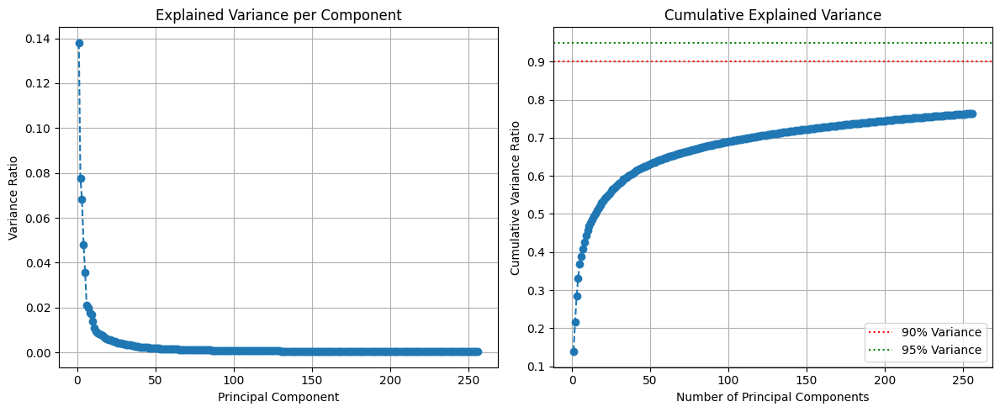

Total variance explained by 256 components: 76.42%


In [ ]:
# Data Preparation (WHOLE LEFT HEMISPHERE Version)

TARGET_SUBJECT = 1
TARGET_HEMISPHERE = 'left'
N_COMPONENTS = 256
BATCH_SIZE = 64
NUM_WORKERS = 0

# --- Transforms ---
img_transform = transforms.Compose([
    transforms.Resize(IMAGE_SIZE),
    transforms.CenterCrop(IMAGE_SIZE),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3),
])


PCA_SAVE_DIR = '/content/drive/MyDrive/DNN experiments/Self-Attentioin/cdcgan_pca_whole_hemi' # Directory for this run
PCA_MODEL_PATH = os.path.join(PCA_SAVE_DIR, f'pca_{N_COMPONENTS}.joblib')
FMRI_LATENT_PATH = os.path.join(PCA_SAVE_DIR, f'fmri_pca_{N_COMPONENTS}.npy')
HEMI_DATA_RAW_PATH = os.path.join(PCA_SAVE_DIR, f'fmri_{TARGET_HEMISPHERE}_hemi_raw.npy') # Save raw hemisphere data

os.makedirs(PCA_SAVE_DIR, exist_ok=True)

fmri_pca_components = None
fmri_hemi_data_np = None


if os.path.exists(PCA_MODEL_PATH) and os.path.exists(FMRI_LATENT_PATH):
    print(f"Loading existing WHOLE HEMISPHERE PCA model and fMRI latent matrix...")
    pca = joblib.load(PCA_MODEL_PATH)
    fmri_pca_components = np.load(FMRI_LATENT_PATH)
    print(f"Loaded PCA components shape: {fmri_pca_components.shape}")

elif os.path.exists(HEMI_DATA_RAW_PATH):
    print(f"Loading existing raw WHOLE HEMISPHERE fMRI data...")
    fmri_hemi_data_np = np.load(HEMI_DATA_RAW_PATH)
    print(f"Loaded raw hemisphere fMRI data shape: {fmri_hemi_data_np.shape}")
    print(f"Fitting PCA ({N_COMPONENTS} components) on loaded raw data...")
    pca = PCA(n_components=N_COMPONENTS, whiten=True, random_state=42)
    fmri_pca_components = pca.fit_transform(fmri_hemi_data_np)
    print(f"PCA fitting complete. Output shape: {fmri_pca_components.shape}")
    print(f"Saving PCA model to {PCA_MODEL_PATH}")
    print(f"Saving fMRI latent matrix to {FMRI_LATENT_PATH}")
    joblib.dump(pca, PCA_MODEL_PATH)
    np.save(FMRI_LATENT_PATH, fmri_pca_components)

else:
    print("Loading WHOLE HEMISPHERE fMRI data and computing PCA from scratch...")
    try:
        # Load the full hemisphere data
        print(f"Loading full {TARGET_HEMISPHERE} hemisphere fMRI data for subject {TARGET_SUBJECT}...")
        fmri_hemi_data_np = load_fmri_of_subject(TARGET_SUBJECT, TARGET_HEMISPHERE, directory=root_dir)

        if fmri_hemi_data_np is None or fmri_hemi_data_np.size == 0:
             raise ValueError(f"Failed to load or empty fMRI data for subject {TARGET_SUBJECT}, hemisphere {TARGET_HEMISPHERE}.")

        print(f"Loaded full hemisphere fMRI data shape: {fmri_hemi_data_np.shape}")
        np.save(HEMI_DATA_RAW_PATH, fmri_hemi_data_np) # Save raw data
        print(f"Saved raw hemisphere fMRI data to {HEMI_DATA_RAW_PATH}")

        # Fit PCA
        print(f"Fitting PCA ({N_COMPONENTS} components)... (This may take time/RAM)")
        pca = PCA(n_components=N_COMPONENTS, whiten=True, random_state=42)
        fmri_pca_components = pca.fit_transform(fmri_hemi_data_np) # -> (n_images, N_COMPONENTS)
        print(f"PCA fitting complete. Output shape: {fmri_pca_components.shape}")

        # Save PCA model and transformed data
        print(f"Saving PCA model to {PCA_MODEL_PATH}")
        print(f"Saving fMRI latent matrix to {FMRI_LATENT_PATH}")
        joblib.dump(pca, PCA_MODEL_PATH)
        np.save(FMRI_LATENT_PATH, fmri_pca_components)

    except (ValueError, FileNotFoundError, IndexError, MemoryError) as e:
        print(f"Error during data loading or PCA: {e}")
        print("Ensure the helper function is correct and you have enough RAM for PCA.")
        fmri_pca_components = None # Ensure this is None on error


class FMRI_Image_PCA_Dataset(Dataset):
    def __init__(self, subject, fmri_pca_data, transform=None):
        self.subject = subject
        self.fmri_pca = torch.from_numpy(fmri_pca_data).float()
        self.transform = transform
        self.num_samples = fmri_pca_data.shape[0]
        self.images = []

        print(f"Preloading {self.num_samples} images for subject {self.subject}...")
        for idx in tqdm(range(self.num_samples), desc="Loading images"):
            img = load_image_subject(self.subject, idx, directory=root_dir)
            if img is None:
                print(f"Error: Failed to load image {idx}. Using placeholder.")
                img = torch.zeros((3, IMAGE_SIZE, IMAGE_SIZE))
            elif self.transform:
                 img = self.transform(img)
            else:
                 img = transforms.ToTensor()(img)
            self.images.append(img)
        try:
            print("Attempting to stack images into a single tensor...")
            self.images = torch.stack(self.images)
            print("Successfully stacked images.")
        except RuntimeError as e:
            print(f"Warning: Could not stack images into a single tensor: {e}. Keeping images as list.")
        print(f"Finished preloading {len(self.images)} images.")

    def __len__(self):
        return self.num_samples

    def __getitem__(self, idx):
        fmri_vec = self.fmri_pca[idx]
        img = self.images[idx]
        return img, fmri_vec


if fmri_pca_components is not None:
    print("Instantiating dataset with preloading...")
    dataset = FMRI_Image_PCA_Dataset(TARGET_SUBJECT, fmri_pca_components, transform=img_transform)
    print("Dataset instantiated.")
    NUM_WORKERS = 0
    print(f"Setting num_workers to {NUM_WORKERS} due to preloading.")
    dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS, pin_memory=True if device.type == 'cuda' else False)
    print(f"Dataset and DataLoader created. Number of samples: {len(dataset)}")

    try:
        img_batch, fmri_batch = next(iter(dataloader))
        print("Sample batch shapes:")
        print(" Image:", img_batch.shape)
        print(" fMRI PCA:", fmri_batch.shape)
    except Exception as e:
        print(f"Error getting batch from DataLoader: {e}")

else:
    print("Dataset/DataLoader creation skipped due to PCA errors.")
    dataloader = None

# --- Plot Explained Variance ---
if 'pca' in locals() and fmri_pca_components is not None:
    explained_variance = pca.explained_variance_ratio_
    cumulative_explained_variance = np.cumsum(explained_variance)
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(range(1, N_COMPONENTS + 1), explained_variance, marker='o', linestyle='--'); plt.title('Explained Variance per Component'); plt.xlabel('Principal Component'); plt.ylabel('Variance Ratio'); plt.grid(True)
    plt.subplot(1, 2, 2)
    plt.plot(range(1, N_COMPONENTS + 1), cumulative_explained_variance, marker='o', linestyle='--'); plt.title('Cumulative Explained Variance'); plt.xlabel('Number of Principal Components'); plt.ylabel('Cumulative Variance Ratio'); plt.axhline(y=0.9, color='r', linestyle=':', label='90% Variance'); plt.axhline(y=0.95, color='g', linestyle=':', label='95% Variance'); plt.legend(); plt.grid(True)
    plt.tight_layout(); plt.show()
    print(f"Total variance explained by {N_COMPONENTS} components: {cumulative_explained_variance[-1]*100:.2f}%")
else:
    print("PCA object not available for plotting explained variance.")

## Models cDCGAN

In [ ]:
class Self_Attn(nn.Module):
    """ Self attention Layer"""
    def __init__(self, in_dim, activation=F.relu):
        super(Self_Attn, self).__init__()
        self.chanel_in = in_dim
        self.activation = activation

        # Query, Key, Value convolutions
        self.query_conv = nn.Conv2d(in_channels=in_dim, out_channels=in_dim // 8, kernel_size=1)
        self.key_conv = nn.Conv2d(in_channels=in_dim, out_channels=in_dim // 8, kernel_size=1)
        self.value_conv = nn.Conv2d(in_channels=in_dim, out_channels=in_dim, kernel_size=1)

        # Gamma parameter for scaling attention output
        self.gamma = nn.Parameter(torch.zeros(1))

        self.softmax = nn.Softmax(dim=-1) # Apply softmax across width*height

    def forward(self, x):
        """
            inputs :
                x : input feature maps( B x C x W x H)
            returns :
                out : self attention value + input feature
                attention: B x N x N (N is Width*Height)
        """
        m_batchsize, C, width, height = x.size()
        N = width * height # Number of features

        # Project features into query, key, value spaces
        proj_query = self.query_conv(x).view(m_batchsize, -1, N).permute(0, 2, 1) # B x N x C'
        proj_key = self.key_conv(x).view(m_batchsize, -1, N) # B x C' x N
        proj_value = self.value_conv(x).view(m_batchsize, -1, N) # B x C x N

        # Calculate attention map
        energy = torch.bmm(proj_query, proj_key) # batch matrix multiplication -> B x N x N
        attention = self.softmax(energy) # B x N x N

        # Apply attention to value projection
        out = torch.bmm(proj_value, attention.permute(0, 2, 1)) # B x C x N
        out = out.view(m_batchsize, C, width, height) # Reshape back B x C x W x H

        # Apply learned gamma scaling and add residual connection
        out = self.gamma * out + x
        return out #, attention # Optionally return attention map for visualization

In [ ]:
nz = 100
fMRI_dim = 256
ngf = 64
ndf = 64
nc = 3
embedding_dim = 128


def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

# --- Generator (with Self-Attention) ---
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.fMRI_embed = nn.Linear(fMRI_dim, embedding_dim)
        combined_input_dim = nz + embedding_dim

        self.layer1 = nn.Sequential(
            nn.ConvTranspose2d(combined_input_dim, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8), nn.ReLU(True)
        ) # -> (ngf*8) x 4 x 4
        self.layer2 = nn.Sequential(
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4), nn.ReLU(True)
        ) # -> (ngf*4) x 8 x 8
        self.layer3 = nn.Sequential(
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2), nn.ReLU(True)
        ) # -> (ngf*2) x 16 x 16

        # ADD SELF-ATTENTION HERE (after 16x16 features)
        self.attn1 = Self_Attn(ngf * 2) # Attention at this channel depth

        self.layer4 = nn.Sequential(
            nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf), nn.ReLU(True)
        ) # -> (ngf) x 32 x 32

        self.layer5 = nn.Sequential(
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
        ) # -> (nc) x 64 x 64

    def forward(self, noise, fmri_condition):
        fmri_embedded = self.fMRI_embed(fmri_condition)
        gen_input = torch.cat((noise, fmri_embedded), 1)
        gen_input_reshaped = gen_input.unsqueeze(-1).unsqueeze(-1)

        out = self.layer1(gen_input_reshaped)
        out = self.layer2(out)
        out = self.layer3(out)
        out = self.attn1(out) # Apply attention
        out = self.layer4(out)
        out = self.layer5(out)
        return out

# --- Discriminator (with Self-Attention, Modified for LSGAN) ---
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.fMRI_embed = nn.Sequential(
            nn.Linear(fMRI_dim, embedding_dim),
            nn.LeakyReLU(0.2, inplace=True)
        )

        self.layer1_img = nn.Sequential(
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False), # -> (ndf) x 32 x 32
            nn.LeakyReLU(0.2, inplace=True)
        )
        self.layer2_comb = nn.Sequential(
             # Takes (ndf + embedding_dim) channels after concat
            nn.Conv2d(ndf + embedding_dim, ndf * 2, 4, 2, 1, bias=False), # -> (ndf*2) x 16 x 16
            nn.BatchNorm2d(ndf * 2), nn.LeakyReLU(0.2, inplace=True)
        )
        self.layer3 = nn.Sequential(
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False), # -> (ndf*4) x 8 x 8
            nn.BatchNorm2d(ndf * 4), nn.LeakyReLU(0.2, inplace=True)
        )

        self.attn1 = Self_Attn(ndf * 4)

        self.layer4 = nn.Sequential(
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False), # -> (ndf*8) x 4 x 4
            nn.BatchNorm2d(ndf * 8), nn.LeakyReLU(0.2, inplace=True)
        )
        self.layer5_final = nn.Sequential(
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False) # -> 1 x 1 x 1 (Logit output for LSGAN)
            # Sigmoid removed for LSGAN
        )

    def forward(self, image, fmri_condition):
        # Process image and condition separately initially
        img_feat_32 = self.layer1_img(image)
        fmri_embedded = self.fMRI_embed(fmri_condition)
        fmri_spatial = fmri_embedded.unsqueeze(-1).unsqueeze(-1).expand(-1, -1, 32, 32)

        # Concatenate and process
        combined_features = torch.cat((img_feat_32, fmri_spatial), 1)
        out = self.layer2_comb(combined_features)
        out = self.layer3(out)
        out = self.attn1(out) # Apply attention
        out = self.layer4(out)
        out = self.layer5_final(out)

        return out.view(-1, 1).squeeze(1) # Flatten output

try:
    netG = Generator().to(device)
    netD = Discriminator().to(device)
    netG.apply(weights_init)
    netD.apply(weights_init)
    print("--- Generator with Self-Attention ---")
    # print(netG) # Can be very long
    print("--- Discriminator with Self-Attention ---")
    # print(netD)
    print("SAGAN Models defined.")
except NameError as e:
    print(f"ERROR: Required parameters not defined: {e}")
    print("Ensure Cell 3 and Cell 5 (or relevant parameter cells) were run.")
    netG = None
    netD = None

--- Generator with Self-Attention ---
--- Discriminator with Self-Attention ---
SAGAN Models defined.


## Training for 1000 epochs

### Training setup

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"Confirming device: {device}")

if 'dataloader' not in locals() or dataloader is None:
     print("ERROR: DataLoader not found. Please run Cell 3 successfully first.")
     ready_to_train = False
elif 'netG' not in locals() or netG is None or 'netD' not in locals() or netD is None:
     print("ERROR: Generator (netG) or Discriminator (netD) not found. Please run Cell 4 successfully first.")
     ready_to_train = False
else:
    ready_to_train = True

if ready_to_train:
    NUM_EPOCHS = 1000
    LR_G = 0.0002
    LR_D = 0.0001
    WEIGHT_DECAY = 0
    BETA1 = 0.5
    BATCH_SIZE = 64
    nz = 100
    fMRI_dim = N_COMPONENTS

    OUTPUT_BASE_DIR = '/content/drive/MyDrive/DNN experiments/Self-Attentioin' # Use the same folder or a new one
    PREVIEW_DIR_CDCGAN = os.path.join(OUTPUT_BASE_DIR, 'previews')
    CHECKPOINT_DIR_CDCGAN = os.path.join(OUTPUT_BASE_DIR, 'checkpoints')
    LOSS_CURVE_G_PATH = os.path.join(OUTPUT_BASE_DIR, 'g_losses.npy')
    LOSS_CURVE_D_PATH = os.path.join(OUTPUT_BASE_DIR, 'd_losses.npy')
    REAL_SAMPLES_PATH = os.path.join(OUTPUT_BASE_DIR, 'real_samples_for_preview.png')

    os.makedirs(PREVIEW_DIR_CDCGAN, exist_ok=True)
    os.makedirs(CHECKPOINT_DIR_CDCGAN, exist_ok=True)
    print(f"Outputs will be saved to: {OUTPUT_BASE_DIR}")

    PREVIEW_EVERY = 20
    CHECKPOINT_EVERY = 100

    fixed_noise = None
    fixed_fmri_condition = None
    real_images_for_preview = None
    try:
        fixed_real_batch, fixed_fmri_batch = next(iter(dataloader))
        preview_batch_size = min(BATCH_SIZE, 16)
        fixed_noise = torch.randn(preview_batch_size, nz, device=device)
        fixed_fmri_condition = fixed_fmri_batch[:preview_batch_size].to(device)
        real_images_for_preview = fixed_real_batch[:preview_batch_size]
        print(f"Using fixed fMRI conditions of shape: {fixed_fmri_condition.shape} for previews")
        if not os.path.exists(REAL_SAMPLES_PATH): # Avoid overwriting if it exists
            vutils.save_image(real_images_for_preview * 0.5 + 0.5, REAL_SAMPLES_PATH, normalize=False, padding=2)
            print(f"Saved real image samples for comparison to {REAL_SAMPLES_PATH}")
        else:
            print(f"Real image samples file already exists at {REAL_SAMPLES_PATH}")
    except StopIteration:
        print("Warning: DataLoader is empty. Cannot set fixed conditions.")
    except Exception as e:
        print(f"Error getting fixed batch: {e}")


    real_label_val = 1.0
    fake_label_val = 0.0
    real_label_smooth_val = 0.9

    criterion = nn.MSELoss()

    optimizerD = optim.Adam(netD.parameters(), lr=LR_D, betas=(BETA1, 0.999), weight_decay=WEIGHT_DECAY)
    optimizerG = optim.Adam(netG.parameters(), lr=LR_G, betas=(BETA1, 0.999), weight_decay=WEIGHT_DECAY)
    print(f"Optimizers initialized with LR_G={LR_G}, LR_D={LR_D}")

    img_list = []
    G_losses_epoch_avg = []
    D_losses_epoch_avg = []

    print("Training setup complete.")
else:
    print("ERROR: Cannot proceed with setup. Ensure previous cells ran without errors.")

Confirming device: cuda:0
Outputs will be saved to: /content/drive/MyDrive/DNN experiments/Self-Attentioin
Using fixed fMRI conditions of shape: torch.Size([16, 256]) for previews
Real image samples file already exists at /content/drive/MyDrive/DNN experiments/Self-Attentioin/real_samples_for_preview.png
Optimizers initialized with LR_G=0.0002, LR_D=0.0001
Training setup complete.


In [ ]:
# Training Loop (LSGAN + SAGAN)

if 'ready_to_train' not in locals() or not ready_to_train:
    print("ERROR: Training setup not complete or failed. Please run previous cells (especially Cell 5).")
elif fixed_fmri_condition is None or fixed_noise is None:
     print("ERROR: Fixed noise or fMRI condition for previews not generated/loaded. Please run Cell 5.")
else:
    print(f"Starting LSGAN+SAGAN Training Loop for {NUM_EPOCHS} epochs...")
    iters = 0
    start_time = time.time()
    final_epoch = 0

    netG.to(device)
    netD.to(device)

    G_losses_epoch_avg = []
    D_losses_epoch_avg = []
    img_list = []


    for epoch in range(1, NUM_EPOCHS + 1):
        epoch_start_time = time.time()
        netG.train()
        netD.train()
        epoch_g_loss = 0.0
        epoch_d_loss = 0.0
        final_epoch = epoch

        progress_bar = tqdm(enumerate(dataloader), total=len(dataloader), desc=f"Epoch {epoch}/{NUM_EPOCHS}")

        for i, data in progress_bar:
            # --- (1) Update Discriminator ---
            netD.zero_grad()
            real_img = data[0].to(device)
            fmri_cond = data[1].to(device)
            b_size = real_img.size(0)

            # Labels for LSGAN (target values for MSE Loss)
            label_real = torch.full((b_size,), real_label_val, dtype=torch.float, device=device) # Target: 1.0
            label_fake = torch.full((b_size,), fake_label_val, dtype=torch.float, device=device) # Target: 0.0

            # Real batch pass
            output_real = netD(real_img, fmri_cond)
            errD_real = criterion(output_real, label_real) # MSE(D(x), 1)
            if torch.isfinite(errD_real): # Check for NaN/Inf
                 errD_real.backward()
            else:
                 print(f"Warning: NaN/Inf detected in errD_real at epoch {epoch}, iter {i}. Skipping backward pass for D_real.")
            D_x = output_real.mean().item()

            # Fake batch pass
            noise = torch.randn(b_size, nz, device=device)
            fake = netG(noise, fmri_cond)
            output_fake = netD(fake.detach(), fmri_cond) # Detach fake
            errD_fake = criterion(output_fake, label_fake) # MSE(D(G(z)), 0)
            if torch.isfinite(errD_fake): # Check for NaN/Inf
                errD_fake.backward()
            else:
                 print(f"Warning: NaN/Inf detected in errD_fake at epoch {epoch}, iter {i}. Skipping backward pass for D_fake.")

            # Only step if gradients are valid
            errD = errD_real + errD_fake
            if torch.isfinite(errD_real) and torch.isfinite(errD_fake):
                optimizerD.step()
            else:
                 print(f"Warning: Skipping optimizerD.step() due to NaN/Inf loss at epoch {epoch}, iter {i}.")


            # Update Generator
            netG.zero_grad()
            label_g = torch.full((b_size,), real_label_val, dtype=torch.float, device=device) # G targets 1.0
            output_g = netD(fake, fmri_cond) # Use non-detached fake
            errG = criterion(output_g, label_g) # MSE(D(G(z)), 1)
            if torch.isfinite(errG): # Check for NaN/Inf
                errG.backward()
                optimizerG.step()
            else:
                print(f"Warning: NaN/Inf detected in errG at epoch {epoch}, iter {i}. Skipping backward/step for G.")

            D_G_z1 = output_fake.mean().item() # Value before G update
            D_G_z2 = output_g.mean().item()    # Value after G update

            # Add checks for NaN/Inf before accumulating
            if torch.isfinite(errG): epoch_g_loss += errG.item()
            if torch.isfinite(errD): epoch_d_loss += errD.item()

            if i % 100 == 0: # Log less frequently
                 progress_bar.set_postfix({
                    'Loss_D': f'{errD.item():.4f}' if torch.isfinite(errD) else 'NaN',
                    'Loss_G': f'{errG.item():.4f}' if torch.isfinite(errG) else 'NaN',
                    'D(x)': f'{D_x:.4f}',
                    'D(G(z))': f'{D_G_z1:.4f}/{D_G_z2:.4f}'
                })
            iters += 1



        loader_len = len(dataloader)
        if loader_len > 0:
            avg_epoch_loss_g = epoch_g_loss / loader_len
            avg_epoch_loss_d = epoch_d_loss / loader_len
        else:
            avg_epoch_loss_g = 0.0
            avg_epoch_loss_d = 0.0

        G_losses_epoch_avg.append(avg_epoch_loss_g)
        D_losses_epoch_avg.append(avg_epoch_loss_d)
        epoch_time = time.time() - epoch_start_time
        print(f'\nEpoch [{epoch}/{NUM_EPOCHS}] finished in {epoch_time:.2f}s. Avg Losses -> G: {avg_epoch_loss_g:.4f}, D: {avg_epoch_loss_d:.4f}')

        # Checkpoint Saving (Models AND Losses)
        if epoch % CHECKPOINT_EVERY == 0 or epoch == NUM_EPOCHS:
             ckpt_path_g = os.path.join(CHECKPOINT_DIR_CDCGAN, f'netG_epoch_{epoch}.pth')
             ckpt_path_d = os.path.join(CHECKPOINT_DIR_CDCGAN, f'netD_epoch_{epoch}.pth')
             torch.save(netG.state_dict(), ckpt_path_g)
             torch.save(netD.state_dict(), ckpt_path_d)
             print(f'💾 Model checkpoints saved for epoch {epoch}')
             try:
                 np.save(LOSS_CURVE_G_PATH, np.array(G_losses_epoch_avg))
                 np.save(LOSS_CURVE_D_PATH, np.array(D_losses_epoch_avg))
                 print(f'📉 Loss curves updated and saved for epoch {epoch}')
             except Exception as e:
                 print(f"Warning: Could not save loss curves at epoch {epoch}: {e}")

        # Preview Generation
        if (epoch % PREVIEW_EVERY == 0 or epoch == NUM_EPOCHS):
             netG.eval()
             with torch.no_grad():

                 fake_preview = netG(fixed_noise, fixed_fmri_condition).detach().cpu()
             img_grid = vutils.make_grid(fake_preview, padding=2, normalize=True, nrow=8) # Normalize for display range [0,1]
             img_list.append(img_grid)
             preview_save_path = os.path.join(PREVIEW_DIR_CDCGAN, f'preview_epoch_{epoch}.png')
             vutils.save_image(img_grid, preview_save_path) # Saves the normalized grid
             print(f'🖼️ Preview grid saved for epoch {epoch}')
             netG.train()

    total_time = time.time() - start_time
    print(f"--- Training Finished (Epoch {final_epoch}/{NUM_EPOCHS}) in {total_time:.2f}s ---")
    torch.save(netG.state_dict(), os.path.join(CHECKPOINT_DIR_CDCGAN, 'netG_final.pth'))
    torch.save(netD.state_dict(), os.path.join(CHECKPOINT_DIR_CDCGAN, 'netD_final.pth'))
    print("✅ Final models saved.")
    np.save(LOSS_CURVE_G_PATH, np.array(G_losses_epoch_avg))
    np.save(LOSS_CURVE_D_PATH, np.array(D_losses_epoch_avg))
    print(f'📉 Final loss curves saved.')

Starting LSGAN+SAGAN Training Loop for 1000 epochs...


Epoch 1/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [1/1000] finished in 17.17s. Avg Losses -> G: 0.6357, D: 1.4510


Epoch 2/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [2/1000] finished in 15.56s. Avg Losses -> G: 0.9835, D: 0.9207


Epoch 3/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [3/1000] finished in 15.61s. Avg Losses -> G: 0.4889, D: 0.7434


Epoch 4/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [4/1000] finished in 15.79s. Avg Losses -> G: 0.3442, D: 0.6614


Epoch 5/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [5/1000] finished in 15.96s. Avg Losses -> G: 0.3196, D: 0.6233


Epoch 6/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [6/1000] finished in 16.12s. Avg Losses -> G: 0.3242, D: 0.6081


Epoch 7/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [7/1000] finished in 16.24s. Avg Losses -> G: 0.3195, D: 0.5971


Epoch 8/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [8/1000] finished in 16.36s. Avg Losses -> G: 0.3037, D: 0.5816


Epoch 9/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [9/1000] finished in 16.42s. Avg Losses -> G: 0.3102, D: 0.5766


Epoch 10/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [10/1000] finished in 16.65s. Avg Losses -> G: 0.3030, D: 0.5637


Epoch 11/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [11/1000] finished in 17.06s. Avg Losses -> G: 0.3050, D: 0.5586


Epoch 12/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [12/1000] finished in 17.09s. Avg Losses -> G: 0.3017, D: 0.5577


Epoch 13/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [13/1000] finished in 16.82s. Avg Losses -> G: 0.3005, D: 0.5517


Epoch 14/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [14/1000] finished in 16.71s. Avg Losses -> G: 0.2966, D: 0.5528


Epoch 15/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [15/1000] finished in 16.76s. Avg Losses -> G: 0.2886, D: 0.5419


Epoch 16/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [16/1000] finished in 16.88s. Avg Losses -> G: 0.2873, D: 0.5366


Epoch 17/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [17/1000] finished in 16.90s. Avg Losses -> G: 0.2879, D: 0.5407


Epoch 18/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [18/1000] finished in 16.86s. Avg Losses -> G: 0.2936, D: 0.5367


Epoch 19/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [19/1000] finished in 16.79s. Avg Losses -> G: 0.2965, D: 0.5352


Epoch 20/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [20/1000] finished in 16.79s. Avg Losses -> G: 0.2966, D: 0.5279
🖼️ Preview grid saved for epoch 20


Epoch 21/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [21/1000] finished in 16.82s. Avg Losses -> G: 0.3013, D: 0.5296


Epoch 22/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [22/1000] finished in 16.82s. Avg Losses -> G: 0.3091, D: 0.5307


Epoch 23/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [23/1000] finished in 16.84s. Avg Losses -> G: 0.3091, D: 0.5248


Epoch 24/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [24/1000] finished in 16.86s. Avg Losses -> G: 0.3168, D: 0.5187


Epoch 25/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [25/1000] finished in 16.84s. Avg Losses -> G: 0.3308, D: 0.5189


Epoch 26/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [26/1000] finished in 16.86s. Avg Losses -> G: 0.3241, D: 0.5130


Epoch 27/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [27/1000] finished in 16.84s. Avg Losses -> G: 0.3365, D: 0.5164


Epoch 28/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [28/1000] finished in 16.85s. Avg Losses -> G: 0.3330, D: 0.5093


Epoch 29/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [29/1000] finished in 16.85s. Avg Losses -> G: 0.3544, D: 0.5092


Epoch 30/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [30/1000] finished in 16.86s. Avg Losses -> G: 0.3652, D: 0.5064


Epoch 31/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [31/1000] finished in 16.86s. Avg Losses -> G: 0.3886, D: 0.4934


Epoch 32/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [32/1000] finished in 16.86s. Avg Losses -> G: 0.3906, D: 0.4874


Epoch 33/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [33/1000] finished in 16.85s. Avg Losses -> G: 0.4064, D: 0.4840


Epoch 34/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [34/1000] finished in 16.85s. Avg Losses -> G: 0.4079, D: 0.4796


Epoch 35/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [35/1000] finished in 16.86s. Avg Losses -> G: 0.4284, D: 0.4741


Epoch 36/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [36/1000] finished in 16.84s. Avg Losses -> G: 0.4422, D: 0.4704


Epoch 37/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [37/1000] finished in 16.84s. Avg Losses -> G: 0.4371, D: 0.4631


Epoch 38/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [38/1000] finished in 16.83s. Avg Losses -> G: 0.4632, D: 0.4497


Epoch 39/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [39/1000] finished in 16.83s. Avg Losses -> G: 0.4744, D: 0.4373


Epoch 40/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [40/1000] finished in 16.80s. Avg Losses -> G: 0.4926, D: 0.4410
🖼️ Preview grid saved for epoch 40


Epoch 41/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [41/1000] finished in 16.78s. Avg Losses -> G: 0.4819, D: 0.4341


Epoch 42/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [42/1000] finished in 16.79s. Avg Losses -> G: 0.5067, D: 0.4368


Epoch 43/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [43/1000] finished in 16.82s. Avg Losses -> G: 0.5049, D: 0.4179


Epoch 44/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [44/1000] finished in 16.81s. Avg Losses -> G: 0.5198, D: 0.4095


Epoch 45/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [45/1000] finished in 16.85s. Avg Losses -> G: 0.5363, D: 0.4080


Epoch 46/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [46/1000] finished in 16.85s. Avg Losses -> G: 0.5488, D: 0.3904


Epoch 47/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [47/1000] finished in 16.88s. Avg Losses -> G: 0.5617, D: 0.3865


Epoch 48/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [48/1000] finished in 16.85s. Avg Losses -> G: 0.5744, D: 0.3767


Epoch 49/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [49/1000] finished in 16.85s. Avg Losses -> G: 0.5953, D: 0.3804


Epoch 50/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [50/1000] finished in 16.84s. Avg Losses -> G: 0.6025, D: 0.3690


Epoch 51/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [51/1000] finished in 16.83s. Avg Losses -> G: 0.6184, D: 0.3548


Epoch 52/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [52/1000] finished in 16.83s. Avg Losses -> G: 0.6298, D: 0.3504


Epoch 53/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [53/1000] finished in 16.82s. Avg Losses -> G: 0.6426, D: 0.3485


Epoch 54/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [54/1000] finished in 16.81s. Avg Losses -> G: 0.6403, D: 0.3475


Epoch 55/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [55/1000] finished in 16.79s. Avg Losses -> G: 0.6392, D: 0.3347


Epoch 56/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [56/1000] finished in 16.81s. Avg Losses -> G: 0.6701, D: 0.3283


Epoch 57/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [57/1000] finished in 16.79s. Avg Losses -> G: 0.6763, D: 0.3208


Epoch 58/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [58/1000] finished in 16.81s. Avg Losses -> G: 0.6902, D: 0.3150


Epoch 59/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [59/1000] finished in 16.80s. Avg Losses -> G: 0.7029, D: 0.3114


Epoch 60/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [60/1000] finished in 16.81s. Avg Losses -> G: 0.7059, D: 0.3117
🖼️ Preview grid saved for epoch 60


Epoch 61/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [61/1000] finished in 16.81s. Avg Losses -> G: 0.7080, D: 0.3048


Epoch 62/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [62/1000] finished in 16.80s. Avg Losses -> G: 0.7273, D: 0.2997


Epoch 63/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [63/1000] finished in 16.81s. Avg Losses -> G: 0.7355, D: 0.2913


Epoch 64/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [64/1000] finished in 16.80s. Avg Losses -> G: 0.7241, D: 0.2993


Epoch 65/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [65/1000] finished in 16.82s. Avg Losses -> G: 0.7469, D: 0.2831


Epoch 66/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [66/1000] finished in 16.81s. Avg Losses -> G: 0.7604, D: 0.2698


Epoch 67/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [67/1000] finished in 16.82s. Avg Losses -> G: 0.7733, D: 0.2700


Epoch 68/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [68/1000] finished in 16.82s. Avg Losses -> G: 0.7686, D: 0.2569


Epoch 69/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [69/1000] finished in 16.82s. Avg Losses -> G: 0.7891, D: 0.2619


Epoch 70/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [70/1000] finished in 16.82s. Avg Losses -> G: 0.7822, D: 0.2648


Epoch 71/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [71/1000] finished in 16.82s. Avg Losses -> G: 0.8004, D: 0.2513


Epoch 72/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [72/1000] finished in 16.82s. Avg Losses -> G: 0.8163, D: 0.2566


Epoch 73/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [73/1000] finished in 16.83s. Avg Losses -> G: 0.8128, D: 0.2447


Epoch 74/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [74/1000] finished in 16.83s. Avg Losses -> G: 0.8208, D: 0.2395


Epoch 75/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [75/1000] finished in 16.81s. Avg Losses -> G: 0.8348, D: 0.2378


Epoch 76/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [76/1000] finished in 16.83s. Avg Losses -> G: 0.8389, D: 0.2295


Epoch 77/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [77/1000] finished in 16.81s. Avg Losses -> G: 0.8474, D: 0.2253


Epoch 78/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [78/1000] finished in 16.81s. Avg Losses -> G: 0.8607, D: 0.2331


Epoch 79/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [79/1000] finished in 16.80s. Avg Losses -> G: 0.8328, D: 0.2341


Epoch 80/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [80/1000] finished in 16.78s. Avg Losses -> G: 0.8551, D: 0.2299
🖼️ Preview grid saved for epoch 80


Epoch 81/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [81/1000] finished in 16.78s. Avg Losses -> G: 0.8382, D: 0.2253


Epoch 82/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [82/1000] finished in 16.79s. Avg Losses -> G: 0.8602, D: 0.2167


Epoch 83/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [83/1000] finished in 16.79s. Avg Losses -> G: 0.8639, D: 0.2182


Epoch 84/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [84/1000] finished in 16.79s. Avg Losses -> G: 0.8672, D: 0.2201


Epoch 85/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [85/1000] finished in 16.82s. Avg Losses -> G: 0.8760, D: 0.2090


Epoch 86/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [86/1000] finished in 16.80s. Avg Losses -> G: 0.8753, D: 0.2124


Epoch 87/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [87/1000] finished in 16.79s. Avg Losses -> G: 0.8889, D: 0.1916


Epoch 88/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [88/1000] finished in 16.80s. Avg Losses -> G: 0.8906, D: 0.2026


Epoch 89/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [89/1000] finished in 16.81s. Avg Losses -> G: 0.8939, D: 0.2158


Epoch 90/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [90/1000] finished in 16.80s. Avg Losses -> G: 0.8947, D: 0.1953


Epoch 91/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [91/1000] finished in 16.81s. Avg Losses -> G: 0.9000, D: 0.2001


Epoch 92/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [92/1000] finished in 16.81s. Avg Losses -> G: 0.8890, D: 0.1978


Epoch 93/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [93/1000] finished in 16.81s. Avg Losses -> G: 0.9043, D: 0.2116


Epoch 94/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [94/1000] finished in 16.80s. Avg Losses -> G: 0.8951, D: 0.1877


Epoch 95/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [95/1000] finished in 16.78s. Avg Losses -> G: 0.8947, D: 0.1775


Epoch 96/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [96/1000] finished in 16.80s. Avg Losses -> G: 0.9333, D: 0.1829


Epoch 97/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [97/1000] finished in 16.80s. Avg Losses -> G: 0.9284, D: 0.1854


Epoch 98/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [98/1000] finished in 16.82s. Avg Losses -> G: 0.9185, D: 0.1773


Epoch 99/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [99/1000] finished in 16.82s. Avg Losses -> G: 0.9090, D: 0.2094


Epoch 100/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [100/1000] finished in 16.83s. Avg Losses -> G: 0.9069, D: 0.1753
💾 Model checkpoints saved for epoch 100
📉 Loss curves updated and saved for epoch 100
🖼️ Preview grid saved for epoch 100


Epoch 101/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [101/1000] finished in 16.89s. Avg Losses -> G: 0.9303, D: 0.1867


Epoch 102/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [102/1000] finished in 16.88s. Avg Losses -> G: 0.9196, D: 0.1726


Epoch 103/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [103/1000] finished in 16.86s. Avg Losses -> G: 0.9316, D: 0.1696


Epoch 104/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [104/1000] finished in 16.87s. Avg Losses -> G: 0.9370, D: 0.1605


Epoch 105/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [105/1000] finished in 16.86s. Avg Losses -> G: 0.9335, D: 0.1959


Epoch 106/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [106/1000] finished in 16.85s. Avg Losses -> G: 0.9260, D: 0.1690


Epoch 107/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [107/1000] finished in 16.87s. Avg Losses -> G: 0.9385, D: 0.1669


Epoch 108/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [108/1000] finished in 16.88s. Avg Losses -> G: 0.9228, D: 0.1820


Epoch 109/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [109/1000] finished in 16.84s. Avg Losses -> G: 0.9251, D: 0.1740


Epoch 110/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [110/1000] finished in 16.88s. Avg Losses -> G: 0.9365, D: 0.1572


Epoch 111/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [111/1000] finished in 16.88s. Avg Losses -> G: 0.9572, D: 0.1488


Epoch 112/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [112/1000] finished in 16.88s. Avg Losses -> G: 0.9460, D: 0.1654


Epoch 113/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [113/1000] finished in 16.89s. Avg Losses -> G: 0.9476, D: 0.1525


Epoch 114/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [114/1000] finished in 16.89s. Avg Losses -> G: 0.9303, D: 0.1738


Epoch 115/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [115/1000] finished in 16.88s. Avg Losses -> G: 0.9230, D: 0.1657


Epoch 116/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [116/1000] finished in 16.90s. Avg Losses -> G: 0.9546, D: 0.1527


Epoch 117/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [117/1000] finished in 16.98s. Avg Losses -> G: 0.9406, D: 0.1448


Epoch 118/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [118/1000] finished in 16.95s. Avg Losses -> G: 0.9624, D: 0.1351


Epoch 119/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [119/1000] finished in 16.95s. Avg Losses -> G: 0.9494, D: 0.1646


Epoch 120/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [120/1000] finished in 16.93s. Avg Losses -> G: 0.9469, D: 0.1619
🖼️ Preview grid saved for epoch 120


Epoch 121/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [121/1000] finished in 16.93s. Avg Losses -> G: 0.9690, D: 0.1456


Epoch 122/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [122/1000] finished in 16.93s. Avg Losses -> G: 0.9580, D: 0.1419


Epoch 123/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [123/1000] finished in 16.92s. Avg Losses -> G: 0.9601, D: 0.1551


Epoch 124/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [124/1000] finished in 16.89s. Avg Losses -> G: 0.9831, D: 0.1581


Epoch 125/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [125/1000] finished in 16.90s. Avg Losses -> G: 0.9429, D: 0.1551


Epoch 126/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [126/1000] finished in 16.90s. Avg Losses -> G: 0.9511, D: 0.1463


Epoch 127/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [127/1000] finished in 16.92s. Avg Losses -> G: 0.9698, D: 0.1465


Epoch 128/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [128/1000] finished in 16.90s. Avg Losses -> G: 0.9641, D: 0.1456


Epoch 129/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [129/1000] finished in 16.88s. Avg Losses -> G: 0.9734, D: 0.1389


Epoch 130/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [130/1000] finished in 16.90s. Avg Losses -> G: 0.9703, D: 0.1554


Epoch 131/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [131/1000] finished in 16.92s. Avg Losses -> G: 0.9496, D: 0.1613


Epoch 132/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [132/1000] finished in 16.91s. Avg Losses -> G: 0.9460, D: 0.1491


Epoch 133/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [133/1000] finished in 16.88s. Avg Losses -> G: 0.9545, D: 0.1427


Epoch 134/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [134/1000] finished in 16.85s. Avg Losses -> G: 0.9679, D: 0.1225


Epoch 135/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [135/1000] finished in 16.82s. Avg Losses -> G: 0.9813, D: 0.1315


Epoch 136/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [136/1000] finished in 16.82s. Avg Losses -> G: 0.9876, D: 0.1318


Epoch 137/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [137/1000] finished in 16.84s. Avg Losses -> G: 0.9810, D: 0.1331


Epoch 138/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [138/1000] finished in 16.82s. Avg Losses -> G: 0.9658, D: 0.1280


Epoch 139/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [139/1000] finished in 16.84s. Avg Losses -> G: 0.9843, D: 0.1496


Epoch 140/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [140/1000] finished in 16.83s. Avg Losses -> G: 0.9651, D: 0.1421
🖼️ Preview grid saved for epoch 140


Epoch 141/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [141/1000] finished in 16.82s. Avg Losses -> G: 0.9661, D: 0.1357


Epoch 142/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [142/1000] finished in 16.84s. Avg Losses -> G: 0.9680, D: 0.1302


Epoch 143/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [143/1000] finished in 16.83s. Avg Losses -> G: 0.9819, D: 0.1334


Epoch 144/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [144/1000] finished in 16.84s. Avg Losses -> G: 0.9655, D: 0.1363


Epoch 145/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [145/1000] finished in 16.88s. Avg Losses -> G: 0.9683, D: 0.1477


Epoch 146/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [146/1000] finished in 16.88s. Avg Losses -> G: 0.9731, D: 0.1304


Epoch 147/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [147/1000] finished in 16.88s. Avg Losses -> G: 0.9692, D: 0.1304


Epoch 148/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [148/1000] finished in 16.87s. Avg Losses -> G: 0.9776, D: 0.1306


Epoch 149/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [149/1000] finished in 16.86s. Avg Losses -> G: 0.9653, D: 0.1305


Epoch 150/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [150/1000] finished in 16.88s. Avg Losses -> G: 0.9809, D: 0.1326


Epoch 151/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [151/1000] finished in 16.88s. Avg Losses -> G: 0.9809, D: 0.1217


Epoch 152/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [152/1000] finished in 16.87s. Avg Losses -> G: 0.9688, D: 0.1189


Epoch 153/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [153/1000] finished in 16.87s. Avg Losses -> G: 0.9763, D: 0.1297


Epoch 154/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [154/1000] finished in 16.88s. Avg Losses -> G: 0.9812, D: 0.1355


Epoch 155/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [155/1000] finished in 16.89s. Avg Losses -> G: 0.9810, D: 0.1380


Epoch 156/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [156/1000] finished in 16.88s. Avg Losses -> G: 0.9587, D: 0.1473


Epoch 157/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [157/1000] finished in 16.90s. Avg Losses -> G: 0.9635, D: 0.1221


Epoch 158/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [158/1000] finished in 16.90s. Avg Losses -> G: 0.9689, D: 0.1219


Epoch 159/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [159/1000] finished in 16.91s. Avg Losses -> G: 0.9840, D: 0.1129


Epoch 160/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [160/1000] finished in 16.91s. Avg Losses -> G: 0.9843, D: 0.1171
🖼️ Preview grid saved for epoch 160


Epoch 161/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [161/1000] finished in 16.90s. Avg Losses -> G: 0.9694, D: 0.1317


Epoch 162/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [162/1000] finished in 16.88s. Avg Losses -> G: 0.9743, D: 0.1312


Epoch 163/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [163/1000] finished in 16.88s. Avg Losses -> G: 0.9649, D: 0.1315


Epoch 164/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [164/1000] finished in 16.88s. Avg Losses -> G: 0.9799, D: 0.1134


Epoch 165/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [165/1000] finished in 16.89s. Avg Losses -> G: 0.9819, D: 0.1259


Epoch 166/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [166/1000] finished in 16.87s. Avg Losses -> G: 0.9629, D: 0.1293


Epoch 167/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [167/1000] finished in 16.89s. Avg Losses -> G: 0.9751, D: 0.1166


Epoch 168/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [168/1000] finished in 16.86s. Avg Losses -> G: 0.9821, D: 0.1171


Epoch 169/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [169/1000] finished in 16.87s. Avg Losses -> G: 0.9906, D: 0.1129


Epoch 170/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [170/1000] finished in 16.87s. Avg Losses -> G: 0.9780, D: 0.1248


Epoch 171/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [171/1000] finished in 16.85s. Avg Losses -> G: 0.9834, D: 0.1167


Epoch 172/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [172/1000] finished in 16.85s. Avg Losses -> G: 0.9837, D: 0.1247


Epoch 173/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [173/1000] finished in 16.86s. Avg Losses -> G: 0.9785, D: 0.1162


Epoch 174/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [174/1000] finished in 16.85s. Avg Losses -> G: 0.9924, D: 0.1119


Epoch 175/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [175/1000] finished in 16.84s. Avg Losses -> G: 0.9864, D: 0.1001


Epoch 176/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [176/1000] finished in 16.84s. Avg Losses -> G: 0.9867, D: 0.1059


Epoch 177/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [177/1000] finished in 16.85s. Avg Losses -> G: 0.9877, D: 0.1246


Epoch 178/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [178/1000] finished in 16.84s. Avg Losses -> G: 0.9988, D: 0.1151


Epoch 179/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [179/1000] finished in 16.84s. Avg Losses -> G: 0.9737, D: 0.1215


Epoch 180/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [180/1000] finished in 16.86s. Avg Losses -> G: 0.9778, D: 0.1028
🖼️ Preview grid saved for epoch 180


Epoch 181/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [181/1000] finished in 16.84s. Avg Losses -> G: 0.9735, D: 0.1143


Epoch 182/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [182/1000] finished in 16.85s. Avg Losses -> G: 0.9774, D: 0.1303


Epoch 183/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [183/1000] finished in 16.86s. Avg Losses -> G: 0.9812, D: 0.1073


Epoch 184/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [184/1000] finished in 16.85s. Avg Losses -> G: 0.9850, D: 0.1116


Epoch 185/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [185/1000] finished in 16.84s. Avg Losses -> G: 0.9799, D: 0.1146


Epoch 186/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [186/1000] finished in 16.87s. Avg Losses -> G: 0.9847, D: 0.1142


Epoch 187/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [187/1000] finished in 16.85s. Avg Losses -> G: 0.9776, D: 0.1158


Epoch 188/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [188/1000] finished in 16.86s. Avg Losses -> G: 0.9660, D: 0.1139


Epoch 189/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [189/1000] finished in 16.86s. Avg Losses -> G: 0.9805, D: 0.0963


Epoch 190/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [190/1000] finished in 16.85s. Avg Losses -> G: 0.9751, D: 0.1090


Epoch 191/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [191/1000] finished in 16.86s. Avg Losses -> G: 0.9865, D: 0.1030


Epoch 192/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [192/1000] finished in 16.83s. Avg Losses -> G: 0.9958, D: 0.0982


Epoch 193/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [193/1000] finished in 16.84s. Avg Losses -> G: 0.9886, D: 0.0945


Epoch 194/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [194/1000] finished in 16.84s. Avg Losses -> G: 0.9859, D: 0.1265


Epoch 195/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [195/1000] finished in 16.87s. Avg Losses -> G: 0.9796, D: 0.1130


Epoch 196/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [196/1000] finished in 16.90s. Avg Losses -> G: 0.9806, D: 0.1124


Epoch 197/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [197/1000] finished in 16.88s. Avg Losses -> G: 0.9868, D: 0.1076


Epoch 198/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [198/1000] finished in 16.87s. Avg Losses -> G: 0.9945, D: 0.1131


Epoch 199/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [199/1000] finished in 16.88s. Avg Losses -> G: 0.9934, D: 0.1050


Epoch 200/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [200/1000] finished in 16.87s. Avg Losses -> G: 0.9868, D: 0.1111
💾 Model checkpoints saved for epoch 200
📉 Loss curves updated and saved for epoch 200
🖼️ Preview grid saved for epoch 200


Epoch 201/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [201/1000] finished in 16.84s. Avg Losses -> G: 0.9768, D: 0.1042


Epoch 202/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [202/1000] finished in 16.84s. Avg Losses -> G: 0.9879, D: 0.1028


Epoch 203/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [203/1000] finished in 16.85s. Avg Losses -> G: 0.9839, D: 0.1048


Epoch 204/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [204/1000] finished in 16.86s. Avg Losses -> G: 0.9844, D: 0.1041


Epoch 205/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [205/1000] finished in 16.85s. Avg Losses -> G: 0.9958, D: 0.1009


Epoch 206/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [206/1000] finished in 16.84s. Avg Losses -> G: 0.9842, D: 0.0948


Epoch 207/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [207/1000] finished in 16.86s. Avg Losses -> G: 0.9974, D: 0.1063


Epoch 208/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [208/1000] finished in 16.87s. Avg Losses -> G: 0.9916, D: 0.1038


Epoch 209/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [209/1000] finished in 16.83s. Avg Losses -> G: 0.9960, D: 0.0912


Epoch 210/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [210/1000] finished in 16.81s. Avg Losses -> G: 0.9778, D: 0.1120


Epoch 211/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [211/1000] finished in 17.00s. Avg Losses -> G: 0.9807, D: 0.0941


Epoch 212/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [212/1000] finished in 16.83s. Avg Losses -> G: 0.9930, D: 0.0969


Epoch 213/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [213/1000] finished in 16.82s. Avg Losses -> G: 1.0048, D: 0.0951


Epoch 214/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [214/1000] finished in 16.82s. Avg Losses -> G: 0.9887, D: 0.0964


Epoch 215/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [215/1000] finished in 16.81s. Avg Losses -> G: 0.9954, D: 0.0959


Epoch 216/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [216/1000] finished in 16.82s. Avg Losses -> G: 0.9914, D: 0.0964


Epoch 217/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [217/1000] finished in 16.83s. Avg Losses -> G: 0.9908, D: 0.0978


Epoch 218/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [218/1000] finished in 16.84s. Avg Losses -> G: 0.9836, D: 0.0986


Epoch 219/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [219/1000] finished in 16.84s. Avg Losses -> G: 1.0043, D: 0.0983


Epoch 220/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [220/1000] finished in 16.86s. Avg Losses -> G: 0.9930, D: 0.1048
🖼️ Preview grid saved for epoch 220


Epoch 221/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [221/1000] finished in 16.83s. Avg Losses -> G: 0.9853, D: 0.1044


Epoch 222/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [222/1000] finished in 16.83s. Avg Losses -> G: 0.9866, D: 0.1023


Epoch 223/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [223/1000] finished in 16.83s. Avg Losses -> G: 0.9894, D: 0.0947


Epoch 224/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [224/1000] finished in 16.82s. Avg Losses -> G: 0.9931, D: 0.0852


Epoch 225/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [225/1000] finished in 16.83s. Avg Losses -> G: 0.9906, D: 0.0929


Epoch 226/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [226/1000] finished in 16.83s. Avg Losses -> G: 0.9872, D: 0.0901


Epoch 227/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [227/1000] finished in 16.82s. Avg Losses -> G: 0.9899, D: 0.0857


Epoch 228/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [228/1000] finished in 16.83s. Avg Losses -> G: 0.9978, D: 0.0989


Epoch 229/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [229/1000] finished in 16.83s. Avg Losses -> G: 0.9965, D: 0.0900


Epoch 230/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [230/1000] finished in 16.82s. Avg Losses -> G: 0.9899, D: 0.1030


Epoch 231/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [231/1000] finished in 16.82s. Avg Losses -> G: 0.9841, D: 0.0955


Epoch 232/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [232/1000] finished in 16.82s. Avg Losses -> G: 0.9914, D: 0.0886


Epoch 233/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [233/1000] finished in 16.83s. Avg Losses -> G: 0.9874, D: 0.1057


Epoch 234/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [234/1000] finished in 16.81s. Avg Losses -> G: 0.9864, D: 0.0950


Epoch 235/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [235/1000] finished in 16.81s. Avg Losses -> G: 0.9846, D: 0.0943


Epoch 236/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [236/1000] finished in 16.82s. Avg Losses -> G: 0.9998, D: 0.0848


Epoch 237/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [237/1000] finished in 16.81s. Avg Losses -> G: 0.9998, D: 0.0820


Epoch 238/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [238/1000] finished in 16.81s. Avg Losses -> G: 0.9931, D: 0.0938


Epoch 239/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [239/1000] finished in 16.82s. Avg Losses -> G: 1.0023, D: 0.0934


Epoch 240/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [240/1000] finished in 16.84s. Avg Losses -> G: 0.9856, D: 0.0977
🖼️ Preview grid saved for epoch 240


Epoch 241/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [241/1000] finished in 16.82s. Avg Losses -> G: 0.9979, D: 0.0938


Epoch 242/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [242/1000] finished in 16.82s. Avg Losses -> G: 0.9927, D: 0.0847


Epoch 243/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [243/1000] finished in 16.82s. Avg Losses -> G: 0.9959, D: 0.0892


Epoch 244/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [244/1000] finished in 16.82s. Avg Losses -> G: 0.9814, D: 0.0956


Epoch 245/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [245/1000] finished in 16.81s. Avg Losses -> G: 0.9915, D: 0.0889


Epoch 246/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [246/1000] finished in 16.79s. Avg Losses -> G: 0.9988, D: 0.0928


Epoch 247/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [247/1000] finished in 16.80s. Avg Losses -> G: 0.9944, D: 0.0853


Epoch 248/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [248/1000] finished in 16.82s. Avg Losses -> G: 0.9901, D: 0.0888


Epoch 249/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [249/1000] finished in 16.83s. Avg Losses -> G: 0.9821, D: 0.0863


Epoch 250/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [250/1000] finished in 16.84s. Avg Losses -> G: 0.9867, D: 0.0832


Epoch 251/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [251/1000] finished in 16.83s. Avg Losses -> G: 0.9927, D: 0.0921


Epoch 252/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [252/1000] finished in 16.84s. Avg Losses -> G: 0.9852, D: 0.0964


Epoch 253/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [253/1000] finished in 16.84s. Avg Losses -> G: 1.0022, D: 0.0916


Epoch 254/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [254/1000] finished in 16.86s. Avg Losses -> G: 1.0029, D: 0.0769


Epoch 255/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [255/1000] finished in 16.85s. Avg Losses -> G: 0.9889, D: 0.0935


Epoch 256/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [256/1000] finished in 16.86s. Avg Losses -> G: 1.0014, D: 0.0767


Epoch 257/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [257/1000] finished in 16.86s. Avg Losses -> G: 0.9970, D: 0.0921


Epoch 258/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [258/1000] finished in 16.83s. Avg Losses -> G: 0.9960, D: 0.0994


Epoch 259/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [259/1000] finished in 16.84s. Avg Losses -> G: 0.9918, D: 0.0883


Epoch 260/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [260/1000] finished in 16.84s. Avg Losses -> G: 1.0038, D: 0.0884
🖼️ Preview grid saved for epoch 260


Epoch 261/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [261/1000] finished in 16.83s. Avg Losses -> G: 0.9869, D: 0.0831


Epoch 262/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [262/1000] finished in 16.84s. Avg Losses -> G: 0.9859, D: 0.1049


Epoch 263/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [263/1000] finished in 16.85s. Avg Losses -> G: 0.9820, D: 0.0751


Epoch 264/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [264/1000] finished in 16.85s. Avg Losses -> G: 1.0053, D: 0.0738


Epoch 265/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [265/1000] finished in 16.83s. Avg Losses -> G: 0.9805, D: 0.0879


Epoch 266/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [266/1000] finished in 16.84s. Avg Losses -> G: 0.9835, D: 0.0970


Epoch 267/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [267/1000] finished in 16.85s. Avg Losses -> G: 0.9943, D: 0.0705


Epoch 268/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [268/1000] finished in 16.84s. Avg Losses -> G: 1.0013, D: 0.0749


Epoch 269/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [269/1000] finished in 16.84s. Avg Losses -> G: 1.0068, D: 0.0801


Epoch 270/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [270/1000] finished in 16.83s. Avg Losses -> G: 0.9913, D: 0.0934


Epoch 271/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [271/1000] finished in 16.84s. Avg Losses -> G: 0.9844, D: 0.0892


Epoch 272/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [272/1000] finished in 16.84s. Avg Losses -> G: 1.0032, D: 0.0842


Epoch 273/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [273/1000] finished in 16.87s. Avg Losses -> G: 0.9920, D: 0.0836


Epoch 274/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [274/1000] finished in 16.87s. Avg Losses -> G: 0.9869, D: 0.0895


Epoch 275/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [275/1000] finished in 16.88s. Avg Losses -> G: 0.9889, D: 0.0838


Epoch 276/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [276/1000] finished in 16.85s. Avg Losses -> G: 0.9920, D: 0.0876


Epoch 277/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [277/1000] finished in 16.84s. Avg Losses -> G: 0.9991, D: 0.0805


Epoch 278/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [278/1000] finished in 16.84s. Avg Losses -> G: 0.9848, D: 0.0918


Epoch 279/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [279/1000] finished in 16.84s. Avg Losses -> G: 0.9880, D: 0.0901


Epoch 280/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [280/1000] finished in 16.82s. Avg Losses -> G: 0.9935, D: 0.0742
🖼️ Preview grid saved for epoch 280


Epoch 281/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [281/1000] finished in 16.82s. Avg Losses -> G: 0.9914, D: 0.0777


Epoch 282/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [282/1000] finished in 16.83s. Avg Losses -> G: 0.9981, D: 0.0785


Epoch 283/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [283/1000] finished in 16.83s. Avg Losses -> G: 1.0001, D: 0.0811


Epoch 284/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [284/1000] finished in 16.86s. Avg Losses -> G: 0.9978, D: 0.0888


Epoch 285/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [285/1000] finished in 16.86s. Avg Losses -> G: 0.9866, D: 0.0836


Epoch 286/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [286/1000] finished in 16.88s. Avg Losses -> G: 1.0015, D: 0.0733


Epoch 287/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [287/1000] finished in 16.83s. Avg Losses -> G: 0.9994, D: 0.0810


Epoch 288/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [288/1000] finished in 16.85s. Avg Losses -> G: 1.0071, D: 0.0825


Epoch 289/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [289/1000] finished in 16.82s. Avg Losses -> G: 1.0032, D: 0.0756


Epoch 290/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [290/1000] finished in 16.83s. Avg Losses -> G: 0.9993, D: 0.0873


Epoch 291/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [291/1000] finished in 16.81s. Avg Losses -> G: 0.9991, D: 0.0821


Epoch 292/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [292/1000] finished in 16.79s. Avg Losses -> G: 0.9873, D: 0.0795


Epoch 293/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [293/1000] finished in 16.82s. Avg Losses -> G: 0.9899, D: 0.0908


Epoch 294/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [294/1000] finished in 16.82s. Avg Losses -> G: 1.0013, D: 0.0797


Epoch 295/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [295/1000] finished in 16.79s. Avg Losses -> G: 0.9966, D: 0.0816


Epoch 296/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [296/1000] finished in 16.82s. Avg Losses -> G: 0.9879, D: 0.0801


Epoch 297/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [297/1000] finished in 16.79s. Avg Losses -> G: 0.9924, D: 0.0832


Epoch 298/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [298/1000] finished in 16.79s. Avg Losses -> G: 1.0104, D: 0.0733


Epoch 299/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [299/1000] finished in 16.81s. Avg Losses -> G: 0.9985, D: 0.0830


Epoch 300/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [300/1000] finished in 16.81s. Avg Losses -> G: 1.0084, D: 0.0760
💾 Model checkpoints saved for epoch 300
📉 Loss curves updated and saved for epoch 300
🖼️ Preview grid saved for epoch 300


Epoch 301/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [301/1000] finished in 16.80s. Avg Losses -> G: 0.9981, D: 0.0840


Epoch 302/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [302/1000] finished in 16.77s. Avg Losses -> G: 0.9953, D: 0.0940


Epoch 303/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [303/1000] finished in 16.80s. Avg Losses -> G: 0.9964, D: 0.0707


Epoch 304/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [304/1000] finished in 16.80s. Avg Losses -> G: 0.9950, D: 0.0769


Epoch 305/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [305/1000] finished in 16.82s. Avg Losses -> G: 1.0042, D: 0.0798


Epoch 306/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [306/1000] finished in 16.82s. Avg Losses -> G: 0.9841, D: 0.0803


Epoch 307/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [307/1000] finished in 16.82s. Avg Losses -> G: 0.9907, D: 0.0821


Epoch 308/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [308/1000] finished in 16.83s. Avg Losses -> G: 0.9963, D: 0.0804


Epoch 309/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [309/1000] finished in 16.82s. Avg Losses -> G: 0.9979, D: 0.0804


Epoch 310/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [310/1000] finished in 16.86s. Avg Losses -> G: 0.9908, D: 0.0786


Epoch 311/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [311/1000] finished in 16.83s. Avg Losses -> G: 0.9978, D: 0.0769


Epoch 312/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [312/1000] finished in 16.84s. Avg Losses -> G: 0.9888, D: 0.0767


Epoch 313/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [313/1000] finished in 16.84s. Avg Losses -> G: 0.9983, D: 0.0763


Epoch 314/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [314/1000] finished in 16.82s. Avg Losses -> G: 0.9946, D: 0.0790


Epoch 315/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [315/1000] finished in 16.81s. Avg Losses -> G: 1.0042, D: 0.0742


Epoch 316/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [316/1000] finished in 16.82s. Avg Losses -> G: 1.0003, D: 0.0793


Epoch 317/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [317/1000] finished in 16.81s. Avg Losses -> G: 1.0016, D: 0.0750


Epoch 318/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [318/1000] finished in 16.82s. Avg Losses -> G: 0.9969, D: 0.0774


Epoch 319/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [319/1000] finished in 16.81s. Avg Losses -> G: 1.0020, D: 0.0762


Epoch 320/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [320/1000] finished in 16.81s. Avg Losses -> G: 0.9963, D: 0.0739
🖼️ Preview grid saved for epoch 320


Epoch 321/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [321/1000] finished in 16.81s. Avg Losses -> G: 1.0055, D: 0.0744


Epoch 322/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [322/1000] finished in 16.82s. Avg Losses -> G: 1.0084, D: 0.0740


Epoch 323/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [323/1000] finished in 16.82s. Avg Losses -> G: 1.0063, D: 0.0899


Epoch 324/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [324/1000] finished in 16.83s. Avg Losses -> G: 0.9930, D: 0.0799


Epoch 325/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [325/1000] finished in 16.84s. Avg Losses -> G: 1.0019, D: 0.0780


Epoch 326/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [326/1000] finished in 16.85s. Avg Losses -> G: 0.9985, D: 0.0738


Epoch 327/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [327/1000] finished in 16.83s. Avg Losses -> G: 0.9933, D: 0.0857


Epoch 328/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [328/1000] finished in 16.83s. Avg Losses -> G: 0.9797, D: 0.0865


Epoch 329/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [329/1000] finished in 16.82s. Avg Losses -> G: 0.9899, D: 0.0758


Epoch 330/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [330/1000] finished in 16.82s. Avg Losses -> G: 0.9974, D: 0.0741


Epoch 331/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [331/1000] finished in 16.82s. Avg Losses -> G: 0.9960, D: 0.0837


Epoch 332/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [332/1000] finished in 16.82s. Avg Losses -> G: 0.9930, D: 0.0755


Epoch 333/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [333/1000] finished in 16.82s. Avg Losses -> G: 0.9940, D: 0.0734


Epoch 334/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [334/1000] finished in 16.79s. Avg Losses -> G: 0.9945, D: 0.0760


Epoch 335/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [335/1000] finished in 16.81s. Avg Losses -> G: 0.9996, D: 0.0774


Epoch 336/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [336/1000] finished in 16.80s. Avg Losses -> G: 0.9956, D: 0.0802


Epoch 337/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [337/1000] finished in 16.81s. Avg Losses -> G: 0.9943, D: 0.0729


Epoch 338/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [338/1000] finished in 16.80s. Avg Losses -> G: 1.0015, D: 0.0791


Epoch 339/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [339/1000] finished in 16.82s. Avg Losses -> G: 0.9905, D: 0.0770


Epoch 340/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [340/1000] finished in 16.80s. Avg Losses -> G: 0.9940, D: 0.0811
🖼️ Preview grid saved for epoch 340


Epoch 341/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [341/1000] finished in 16.80s. Avg Losses -> G: 0.9832, D: 0.0799


Epoch 342/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [342/1000] finished in 16.81s. Avg Losses -> G: 0.9838, D: 0.0846


Epoch 343/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [343/1000] finished in 16.80s. Avg Losses -> G: 0.9927, D: 0.0816


Epoch 344/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [344/1000] finished in 16.83s. Avg Losses -> G: 0.9922, D: 0.0743


Epoch 345/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [345/1000] finished in 16.82s. Avg Losses -> G: 0.9853, D: 0.0779


Epoch 346/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [346/1000] finished in 16.82s. Avg Losses -> G: 0.9950, D: 0.0755


Epoch 347/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [347/1000] finished in 16.81s. Avg Losses -> G: 0.9933, D: 0.0812


Epoch 348/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [348/1000] finished in 16.80s. Avg Losses -> G: 0.9985, D: 0.0749


Epoch 349/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [349/1000] finished in 16.81s. Avg Losses -> G: 0.9903, D: 0.0809


Epoch 350/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [350/1000] finished in 16.80s. Avg Losses -> G: 0.9895, D: 0.0717


Epoch 351/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [351/1000] finished in 16.81s. Avg Losses -> G: 1.0077, D: 0.0696


Epoch 352/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [352/1000] finished in 16.82s. Avg Losses -> G: 0.9868, D: 0.0782


Epoch 353/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [353/1000] finished in 16.83s. Avg Losses -> G: 0.9943, D: 0.0707


Epoch 354/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [354/1000] finished in 16.84s. Avg Losses -> G: 1.0004, D: 0.0784


Epoch 355/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [355/1000] finished in 16.82s. Avg Losses -> G: 0.9928, D: 0.0735


Epoch 356/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [356/1000] finished in 16.79s. Avg Losses -> G: 0.9963, D: 0.0910


Epoch 357/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [357/1000] finished in 16.78s. Avg Losses -> G: 0.9861, D: 0.0810


Epoch 358/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [358/1000] finished in 16.77s. Avg Losses -> G: 0.9930, D: 0.0729


Epoch 359/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [359/1000] finished in 16.80s. Avg Losses -> G: 0.9930, D: 0.0817


Epoch 360/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [360/1000] finished in 16.83s. Avg Losses -> G: 0.9784, D: 0.0830
🖼️ Preview grid saved for epoch 360


Epoch 361/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [361/1000] finished in 16.87s. Avg Losses -> G: 0.9869, D: 0.0769


Epoch 362/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [362/1000] finished in 16.85s. Avg Losses -> G: 0.9913, D: 0.0720


Epoch 363/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [363/1000] finished in 16.85s. Avg Losses -> G: 0.9902, D: 0.0760


Epoch 364/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [364/1000] finished in 16.84s. Avg Losses -> G: 0.9912, D: 0.0786


Epoch 365/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [365/1000] finished in 16.83s. Avg Losses -> G: 0.9911, D: 0.0793


Epoch 366/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [366/1000] finished in 16.83s. Avg Losses -> G: 0.9975, D: 0.0679


Epoch 367/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [367/1000] finished in 16.85s. Avg Losses -> G: 0.9875, D: 0.0885


Epoch 368/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [368/1000] finished in 16.86s. Avg Losses -> G: 0.9770, D: 0.0807


Epoch 369/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [369/1000] finished in 16.83s. Avg Losses -> G: 0.9853, D: 0.0739


Epoch 370/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [370/1000] finished in 16.84s. Avg Losses -> G: 0.9909, D: 0.0769


Epoch 371/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [371/1000] finished in 16.83s. Avg Losses -> G: 0.9978, D: 0.0755


Epoch 372/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [372/1000] finished in 16.88s. Avg Losses -> G: 0.9869, D: 0.0768


Epoch 373/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [373/1000] finished in 16.83s. Avg Losses -> G: 0.9888, D: 0.0776


Epoch 374/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [374/1000] finished in 16.84s. Avg Losses -> G: 0.9952, D: 0.0827


Epoch 375/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [375/1000] finished in 16.81s. Avg Losses -> G: 0.9849, D: 0.0752


Epoch 376/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [376/1000] finished in 16.81s. Avg Losses -> G: 0.9849, D: 0.0714


Epoch 377/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [377/1000] finished in 16.79s. Avg Losses -> G: 0.9977, D: 0.0729


Epoch 378/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [378/1000] finished in 16.79s. Avg Losses -> G: 0.9942, D: 0.0755


Epoch 379/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [379/1000] finished in 16.84s. Avg Losses -> G: 0.9907, D: 0.0751


Epoch 380/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [380/1000] finished in 16.88s. Avg Losses -> G: 0.9846, D: 0.0747
🖼️ Preview grid saved for epoch 380


Epoch 381/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [381/1000] finished in 16.89s. Avg Losses -> G: 0.9887, D: 0.0764


Epoch 382/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [382/1000] finished in 16.90s. Avg Losses -> G: 0.9782, D: 0.0759


Epoch 383/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [383/1000] finished in 16.91s. Avg Losses -> G: 0.9926, D: 0.0686


Epoch 384/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [384/1000] finished in 16.90s. Avg Losses -> G: 1.0036, D: 0.0729


Epoch 385/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [385/1000] finished in 16.90s. Avg Losses -> G: 0.9853, D: 0.0789


Epoch 386/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [386/1000] finished in 16.92s. Avg Losses -> G: 1.0002, D: 0.0781


Epoch 387/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [387/1000] finished in 16.92s. Avg Losses -> G: 0.9909, D: 0.0792


Epoch 388/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [388/1000] finished in 16.91s. Avg Losses -> G: 0.9764, D: 0.0844


Epoch 389/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [389/1000] finished in 16.92s. Avg Losses -> G: 0.9895, D: 0.0753


Epoch 390/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [390/1000] finished in 16.91s. Avg Losses -> G: 0.9816, D: 0.0760


Epoch 391/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [391/1000] finished in 16.91s. Avg Losses -> G: 0.9932, D: 0.0674


Epoch 392/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [392/1000] finished in 16.90s. Avg Losses -> G: 0.9966, D: 0.0738


Epoch 393/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [393/1000] finished in 16.92s. Avg Losses -> G: 0.9969, D: 0.0834


Epoch 394/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [394/1000] finished in 16.93s. Avg Losses -> G: 0.9843, D: 0.0758


Epoch 395/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [395/1000] finished in 16.91s. Avg Losses -> G: 0.9864, D: 0.0772


Epoch 396/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [396/1000] finished in 16.90s. Avg Losses -> G: 0.9951, D: 0.0693


Epoch 397/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [397/1000] finished in 16.84s. Avg Losses -> G: 0.9925, D: 0.0779


Epoch 398/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [398/1000] finished in 16.84s. Avg Losses -> G: 0.9922, D: 0.0764


Epoch 399/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [399/1000] finished in 16.84s. Avg Losses -> G: 0.9971, D: 0.0699


Epoch 400/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [400/1000] finished in 16.82s. Avg Losses -> G: 0.9817, D: 0.0782
💾 Model checkpoints saved for epoch 400
📉 Loss curves updated and saved for epoch 400
🖼️ Preview grid saved for epoch 400


Epoch 401/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [401/1000] finished in 16.79s. Avg Losses -> G: 0.9883, D: 0.0786


Epoch 402/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [402/1000] finished in 16.81s. Avg Losses -> G: 0.9882, D: 0.0745


Epoch 403/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [403/1000] finished in 16.81s. Avg Losses -> G: 0.9939, D: 0.0794


Epoch 404/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [404/1000] finished in 16.80s. Avg Losses -> G: 0.9914, D: 0.0738


Epoch 405/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [405/1000] finished in 16.81s. Avg Losses -> G: 0.9896, D: 0.0727


Epoch 406/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [406/1000] finished in 16.78s. Avg Losses -> G: 0.9926, D: 0.0794


Epoch 407/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [407/1000] finished in 16.80s. Avg Losses -> G: 0.9848, D: 0.0781


Epoch 408/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [408/1000] finished in 16.79s. Avg Losses -> G: 0.9913, D: 0.0808


Epoch 409/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [409/1000] finished in 16.79s. Avg Losses -> G: 0.9805, D: 0.0777


Epoch 410/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [410/1000] finished in 16.80s. Avg Losses -> G: 0.9868, D: 0.0695


Epoch 411/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [411/1000] finished in 16.80s. Avg Losses -> G: 0.9871, D: 0.0724


Epoch 412/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [412/1000] finished in 16.81s. Avg Losses -> G: 0.9902, D: 0.0729


Epoch 413/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [413/1000] finished in 16.81s. Avg Losses -> G: 0.9797, D: 0.0838


Epoch 414/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [414/1000] finished in 16.81s. Avg Losses -> G: 0.9910, D: 0.0782


Epoch 415/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [415/1000] finished in 16.84s. Avg Losses -> G: 0.9884, D: 0.0731


Epoch 416/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [416/1000] finished in 16.83s. Avg Losses -> G: 0.9838, D: 0.0712


Epoch 417/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [417/1000] finished in 16.82s. Avg Losses -> G: 0.9927, D: 0.0742


Epoch 418/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [418/1000] finished in 16.81s. Avg Losses -> G: 1.0001, D: 0.0733


Epoch 419/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [419/1000] finished in 16.79s. Avg Losses -> G: 0.9879, D: 0.0862


Epoch 420/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [420/1000] finished in 16.79s. Avg Losses -> G: 0.9875, D: 0.0728
🖼️ Preview grid saved for epoch 420


Epoch 421/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [421/1000] finished in 16.78s. Avg Losses -> G: 0.9942, D: 0.0789


Epoch 422/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [422/1000] finished in 16.80s. Avg Losses -> G: 0.9920, D: 0.0724


Epoch 423/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [423/1000] finished in 16.82s. Avg Losses -> G: 0.9856, D: 0.0801


Epoch 424/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [424/1000] finished in 16.83s. Avg Losses -> G: 0.9919, D: 0.0764


Epoch 425/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [425/1000] finished in 16.84s. Avg Losses -> G: 0.9837, D: 0.0769


Epoch 426/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [426/1000] finished in 16.83s. Avg Losses -> G: 0.9902, D: 0.0741


Epoch 427/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [427/1000] finished in 16.82s. Avg Losses -> G: 0.9953, D: 0.0773


Epoch 428/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [428/1000] finished in 16.83s. Avg Losses -> G: 0.9979, D: 0.0728


Epoch 429/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [429/1000] finished in 16.82s. Avg Losses -> G: 0.9932, D: 0.0833


Epoch 430/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [430/1000] finished in 16.83s. Avg Losses -> G: 0.9819, D: 0.0785


Epoch 431/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [431/1000] finished in 16.83s. Avg Losses -> G: 0.9849, D: 0.0780


Epoch 432/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [432/1000] finished in 16.82s. Avg Losses -> G: 0.9832, D: 0.0762


Epoch 433/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [433/1000] finished in 16.83s. Avg Losses -> G: 0.9846, D: 0.0764


Epoch 434/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [434/1000] finished in 16.81s. Avg Losses -> G: 0.9776, D: 0.0830


Epoch 435/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [435/1000] finished in 16.81s. Avg Losses -> G: 0.9777, D: 0.0724


Epoch 436/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [436/1000] finished in 16.82s. Avg Losses -> G: 0.9964, D: 0.0698


Epoch 437/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [437/1000] finished in 16.84s. Avg Losses -> G: 0.9878, D: 0.0704


Epoch 438/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [438/1000] finished in 16.84s. Avg Losses -> G: 0.9873, D: 0.0751


Epoch 439/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [439/1000] finished in 16.82s. Avg Losses -> G: 0.9866, D: 0.0795


Epoch 440/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [440/1000] finished in 16.82s. Avg Losses -> G: 0.9813, D: 0.0747
🖼️ Preview grid saved for epoch 440


Epoch 441/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [441/1000] finished in 16.80s. Avg Losses -> G: 0.9907, D: 0.0689


Epoch 442/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [442/1000] finished in 16.81s. Avg Losses -> G: 0.9803, D: 0.0771


Epoch 443/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [443/1000] finished in 16.78s. Avg Losses -> G: 0.9927, D: 0.0807


Epoch 444/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [444/1000] finished in 16.81s. Avg Losses -> G: 0.9878, D: 0.0741


Epoch 445/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [445/1000] finished in 16.82s. Avg Losses -> G: 0.9956, D: 0.0717


Epoch 446/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [446/1000] finished in 16.84s. Avg Losses -> G: 0.9860, D: 0.0780


Epoch 447/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [447/1000] finished in 16.84s. Avg Losses -> G: 0.9919, D: 0.0748


Epoch 448/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [448/1000] finished in 16.84s. Avg Losses -> G: 0.9923, D: 0.0692


Epoch 449/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [449/1000] finished in 16.85s. Avg Losses -> G: 0.9795, D: 0.0767


Epoch 450/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [450/1000] finished in 16.88s. Avg Losses -> G: 0.9845, D: 0.0712


Epoch 451/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [451/1000] finished in 16.85s. Avg Losses -> G: 0.9956, D: 0.0698


Epoch 452/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [452/1000] finished in 16.84s. Avg Losses -> G: 0.9894, D: 0.0732


Epoch 453/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [453/1000] finished in 16.83s. Avg Losses -> G: 0.9813, D: 0.0773


Epoch 454/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [454/1000] finished in 16.80s. Avg Losses -> G: 0.9972, D: 0.0730


Epoch 455/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [455/1000] finished in 16.80s. Avg Losses -> G: 0.9875, D: 0.0798


Epoch 456/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [456/1000] finished in 16.82s. Avg Losses -> G: 0.9955, D: 0.0707


Epoch 457/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [457/1000] finished in 16.82s. Avg Losses -> G: 0.9965, D: 0.0734


Epoch 458/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [458/1000] finished in 16.83s. Avg Losses -> G: 0.9883, D: 0.0820


Epoch 459/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [459/1000] finished in 16.84s. Avg Losses -> G: 0.9930, D: 0.0775


Epoch 460/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [460/1000] finished in 16.85s. Avg Losses -> G: 0.9785, D: 0.0734
🖼️ Preview grid saved for epoch 460


Epoch 461/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [461/1000] finished in 16.83s. Avg Losses -> G: 0.9909, D: 0.0738


Epoch 462/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [462/1000] finished in 16.81s. Avg Losses -> G: 0.9970, D: 0.0765


Epoch 463/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [463/1000] finished in 16.81s. Avg Losses -> G: 0.9897, D: 0.0704


Epoch 464/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [464/1000] finished in 16.80s. Avg Losses -> G: 0.9856, D: 0.0772


Epoch 465/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [465/1000] finished in 16.80s. Avg Losses -> G: 0.9892, D: 0.0736


Epoch 466/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [466/1000] finished in 16.79s. Avg Losses -> G: 0.9820, D: 0.0765


Epoch 467/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [467/1000] finished in 16.81s. Avg Losses -> G: 0.9809, D: 0.0793


Epoch 468/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [468/1000] finished in 16.80s. Avg Losses -> G: 0.9879, D: 0.0757


Epoch 469/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [469/1000] finished in 16.80s. Avg Losses -> G: 0.9930, D: 0.0754


Epoch 470/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [470/1000] finished in 16.80s. Avg Losses -> G: 0.9897, D: 0.0732


Epoch 471/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [471/1000] finished in 16.82s. Avg Losses -> G: 0.9846, D: 0.0771


Epoch 472/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [472/1000] finished in 16.82s. Avg Losses -> G: 0.9812, D: 0.0888


Epoch 473/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [473/1000] finished in 16.83s. Avg Losses -> G: 0.9799, D: 0.0761


Epoch 474/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [474/1000] finished in 16.83s. Avg Losses -> G: 0.9835, D: 0.0755


Epoch 475/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [475/1000] finished in 16.83s. Avg Losses -> G: 0.9839, D: 0.0702


Epoch 476/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [476/1000] finished in 16.83s. Avg Losses -> G: 0.9926, D: 0.0759


Epoch 477/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [477/1000] finished in 16.83s. Avg Losses -> G: 0.9923, D: 0.0756


Epoch 478/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [478/1000] finished in 16.85s. Avg Losses -> G: 0.9875, D: 0.0796


Epoch 479/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [479/1000] finished in 16.83s. Avg Losses -> G: 0.9868, D: 0.0709


Epoch 480/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [480/1000] finished in 16.82s. Avg Losses -> G: 0.9874, D: 0.0770
🖼️ Preview grid saved for epoch 480


Epoch 481/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [481/1000] finished in 16.81s. Avg Losses -> G: 0.9903, D: 0.0788


Epoch 482/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [482/1000] finished in 16.85s. Avg Losses -> G: 0.9794, D: 0.0864


Epoch 483/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [483/1000] finished in 16.84s. Avg Losses -> G: 0.9764, D: 0.0835


Epoch 484/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [484/1000] finished in 16.83s. Avg Losses -> G: 0.9771, D: 0.0761


Epoch 485/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [485/1000] finished in 16.82s. Avg Losses -> G: 0.9905, D: 0.0748


Epoch 486/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [486/1000] finished in 16.79s. Avg Losses -> G: 0.9951, D: 0.0772


Epoch 487/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [487/1000] finished in 16.79s. Avg Losses -> G: 0.9790, D: 0.0783


Epoch 488/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [488/1000] finished in 16.80s. Avg Losses -> G: 0.9841, D: 0.0796


Epoch 489/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [489/1000] finished in 16.81s. Avg Losses -> G: 0.9652, D: 0.0884


Epoch 490/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [490/1000] finished in 16.81s. Avg Losses -> G: 0.9751, D: 0.0856


Epoch 491/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [491/1000] finished in 16.83s. Avg Losses -> G: 0.9840, D: 0.0880


Epoch 492/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [492/1000] finished in 16.84s. Avg Losses -> G: 0.9826, D: 0.0759


Epoch 493/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [493/1000] finished in 16.82s. Avg Losses -> G: 0.9784, D: 0.0756


Epoch 494/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [494/1000] finished in 16.81s. Avg Losses -> G: 0.9798, D: 0.0757


Epoch 495/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [495/1000] finished in 16.81s. Avg Losses -> G: 0.9754, D: 0.0733


Epoch 496/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [496/1000] finished in 16.85s. Avg Losses -> G: 0.9850, D: 0.0783


Epoch 497/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [497/1000] finished in 16.83s. Avg Losses -> G: 0.9716, D: 0.0805


Epoch 498/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [498/1000] finished in 16.81s. Avg Losses -> G: 0.9856, D: 0.0753


Epoch 499/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [499/1000] finished in 16.81s. Avg Losses -> G: 1.0010, D: 0.0812


Epoch 500/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [500/1000] finished in 16.80s. Avg Losses -> G: 0.9859, D: 0.0806
💾 Model checkpoints saved for epoch 500
📉 Loss curves updated and saved for epoch 500
🖼️ Preview grid saved for epoch 500


Epoch 501/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [501/1000] finished in 16.80s. Avg Losses -> G: 0.9824, D: 0.0776


Epoch 502/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [502/1000] finished in 16.82s. Avg Losses -> G: 0.9835, D: 0.0812


Epoch 503/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [503/1000] finished in 16.82s. Avg Losses -> G: 0.9909, D: 0.0763


Epoch 504/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [504/1000] finished in 16.81s. Avg Losses -> G: 0.9855, D: 0.0812


Epoch 505/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [505/1000] finished in 16.83s. Avg Losses -> G: 0.9779, D: 0.0715


Epoch 506/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [506/1000] finished in 16.84s. Avg Losses -> G: 0.9784, D: 0.0755


Epoch 507/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [507/1000] finished in 16.83s. Avg Losses -> G: 0.9868, D: 0.0790


Epoch 508/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [508/1000] finished in 16.82s. Avg Losses -> G: 0.9909, D: 0.0750


Epoch 509/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [509/1000] finished in 16.83s. Avg Losses -> G: 0.9781, D: 0.0795


Epoch 510/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [510/1000] finished in 16.83s. Avg Losses -> G: 0.9836, D: 0.0779


Epoch 511/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [511/1000] finished in 16.83s. Avg Losses -> G: 0.9897, D: 0.0769


Epoch 512/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [512/1000] finished in 16.81s. Avg Losses -> G: 0.9852, D: 0.0754


Epoch 513/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [513/1000] finished in 16.82s. Avg Losses -> G: 0.9974, D: 0.0798


Epoch 514/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [514/1000] finished in 16.82s. Avg Losses -> G: 0.9716, D: 0.0893


Epoch 515/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [515/1000] finished in 16.84s. Avg Losses -> G: 0.9763, D: 0.0838


Epoch 516/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [516/1000] finished in 16.83s. Avg Losses -> G: 0.9744, D: 0.0845


Epoch 517/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [517/1000] finished in 16.82s. Avg Losses -> G: 0.9777, D: 0.0888


Epoch 518/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [518/1000] finished in 16.81s. Avg Losses -> G: 0.9774, D: 0.0847


Epoch 519/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [519/1000] finished in 16.80s. Avg Losses -> G: 0.9746, D: 0.0775


Epoch 520/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [520/1000] finished in 16.81s. Avg Losses -> G: 0.9828, D: 0.0791
🖼️ Preview grid saved for epoch 520


Epoch 521/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [521/1000] finished in 16.81s. Avg Losses -> G: 0.9761, D: 0.0914


Epoch 522/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [522/1000] finished in 16.80s. Avg Losses -> G: 0.9669, D: 0.0840


Epoch 523/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [523/1000] finished in 16.81s. Avg Losses -> G: 0.9711, D: 0.0834


Epoch 524/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [524/1000] finished in 16.86s. Avg Losses -> G: 0.9728, D: 0.0828


Epoch 525/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [525/1000] finished in 16.85s. Avg Losses -> G: 0.9744, D: 0.0836


Epoch 526/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [526/1000] finished in 16.85s. Avg Losses -> G: 0.9904, D: 0.0815


Epoch 527/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [527/1000] finished in 16.90s. Avg Losses -> G: 0.9696, D: 0.0875


Epoch 528/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [528/1000] finished in 16.82s. Avg Losses -> G: 0.9807, D: 0.0831


Epoch 529/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [529/1000] finished in 16.82s. Avg Losses -> G: 0.9766, D: 0.0819


Epoch 530/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [530/1000] finished in 16.82s. Avg Losses -> G: 0.9713, D: 0.0833


Epoch 531/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [531/1000] finished in 16.81s. Avg Losses -> G: 0.9678, D: 0.0879


Epoch 532/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [532/1000] finished in 16.81s. Avg Losses -> G: 0.9746, D: 0.0827


Epoch 533/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [533/1000] finished in 16.80s. Avg Losses -> G: 0.9755, D: 0.0811


Epoch 534/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [534/1000] finished in 16.80s. Avg Losses -> G: 0.9727, D: 0.0867


Epoch 535/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [535/1000] finished in 16.81s. Avg Losses -> G: 0.9798, D: 0.0786


Epoch 536/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [536/1000] finished in 16.81s. Avg Losses -> G: 0.9666, D: 0.0843


Epoch 537/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [537/1000] finished in 16.80s. Avg Losses -> G: 0.9684, D: 0.0838


Epoch 538/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [538/1000] finished in 16.80s. Avg Losses -> G: 0.9750, D: 0.0771


Epoch 539/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [539/1000] finished in 16.79s. Avg Losses -> G: 0.9763, D: 0.0873


Epoch 540/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [540/1000] finished in 16.80s. Avg Losses -> G: 0.9677, D: 0.0838
🖼️ Preview grid saved for epoch 540


Epoch 541/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [541/1000] finished in 16.79s. Avg Losses -> G: 0.9763, D: 0.0869


Epoch 542/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [542/1000] finished in 16.77s. Avg Losses -> G: 0.9598, D: 0.0944


Epoch 543/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [543/1000] finished in 16.78s. Avg Losses -> G: 0.9612, D: 0.0916


Epoch 544/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [544/1000] finished in 16.79s. Avg Losses -> G: 0.9630, D: 0.0877


Epoch 545/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [545/1000] finished in 16.77s. Avg Losses -> G: 0.9694, D: 0.0900


Epoch 546/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [546/1000] finished in 16.79s. Avg Losses -> G: 0.9700, D: 0.0832


Epoch 547/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [547/1000] finished in 16.79s. Avg Losses -> G: 0.9723, D: 0.0899


Epoch 548/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [548/1000] finished in 16.78s. Avg Losses -> G: 0.9741, D: 0.0831


Epoch 549/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [549/1000] finished in 16.78s. Avg Losses -> G: 0.9681, D: 0.0849


Epoch 550/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [550/1000] finished in 16.79s. Avg Losses -> G: 0.9769, D: 0.0820


Epoch 551/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [551/1000] finished in 16.79s. Avg Losses -> G: 0.9724, D: 0.0847


Epoch 552/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [552/1000] finished in 16.80s. Avg Losses -> G: 0.9665, D: 0.0943


Epoch 553/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [553/1000] finished in 16.79s. Avg Losses -> G: 0.9754, D: 0.0806


Epoch 554/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [554/1000] finished in 16.79s. Avg Losses -> G: 0.9692, D: 0.0924


Epoch 555/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [555/1000] finished in 16.77s. Avg Losses -> G: 0.9736, D: 0.0884


Epoch 556/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [556/1000] finished in 16.79s. Avg Losses -> G: 0.9657, D: 0.0962


Epoch 557/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [557/1000] finished in 16.79s. Avg Losses -> G: 0.9687, D: 0.0865


Epoch 558/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [558/1000] finished in 16.79s. Avg Losses -> G: 0.9688, D: 0.0893


Epoch 559/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [559/1000] finished in 16.78s. Avg Losses -> G: 0.9812, D: 0.0914


Epoch 560/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [560/1000] finished in 16.80s. Avg Losses -> G: 0.9603, D: 0.0907
🖼️ Preview grid saved for epoch 560


Epoch 561/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [561/1000] finished in 16.78s. Avg Losses -> G: 0.9662, D: 0.0868


Epoch 562/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [562/1000] finished in 16.78s. Avg Losses -> G: 0.9722, D: 0.0838


Epoch 563/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [563/1000] finished in 16.80s. Avg Losses -> G: 0.9583, D: 0.0882


Epoch 564/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [564/1000] finished in 16.80s. Avg Losses -> G: 0.9719, D: 0.0897


Epoch 565/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [565/1000] finished in 16.80s. Avg Losses -> G: 0.9713, D: 0.0852


Epoch 566/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [566/1000] finished in 16.79s. Avg Losses -> G: 0.9733, D: 0.0867


Epoch 567/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [567/1000] finished in 16.79s. Avg Losses -> G: 0.9632, D: 0.0947


Epoch 568/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [568/1000] finished in 16.80s. Avg Losses -> G: 0.9554, D: 0.0951


Epoch 569/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [569/1000] finished in 16.80s. Avg Losses -> G: 0.9632, D: 0.0988


Epoch 570/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [570/1000] finished in 16.79s. Avg Losses -> G: 0.9593, D: 0.0977


Epoch 571/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [571/1000] finished in 16.80s. Avg Losses -> G: 0.9611, D: 0.0886


Epoch 572/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [572/1000] finished in 16.80s. Avg Losses -> G: 0.9687, D: 0.0865


Epoch 573/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [573/1000] finished in 16.81s. Avg Losses -> G: 0.9596, D: 0.0927


Epoch 574/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [574/1000] finished in 16.81s. Avg Losses -> G: 0.9788, D: 0.0910


Epoch 575/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [575/1000] finished in 16.83s. Avg Losses -> G: 0.9442, D: 0.1018


Epoch 576/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [576/1000] finished in 16.84s. Avg Losses -> G: 0.9721, D: 0.0914


Epoch 577/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [577/1000] finished in 16.80s. Avg Losses -> G: 0.9694, D: 0.1012


Epoch 578/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [578/1000] finished in 16.82s. Avg Losses -> G: 0.9609, D: 0.0931


Epoch 579/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [579/1000] finished in 16.80s. Avg Losses -> G: 0.9572, D: 0.0989


Epoch 580/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [580/1000] finished in 16.79s. Avg Losses -> G: 0.9600, D: 0.0939
🖼️ Preview grid saved for epoch 580


Epoch 581/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [581/1000] finished in 16.81s. Avg Losses -> G: 0.9722, D: 0.0881


Epoch 582/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [582/1000] finished in 16.83s. Avg Losses -> G: 0.9606, D: 0.0921


Epoch 583/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [583/1000] finished in 16.85s. Avg Losses -> G: 0.9508, D: 0.0955


Epoch 584/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [584/1000] finished in 16.84s. Avg Losses -> G: 0.9561, D: 0.0880


Epoch 585/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [585/1000] finished in 16.82s. Avg Losses -> G: 0.9629, D: 0.0982


Epoch 586/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [586/1000] finished in 16.86s. Avg Losses -> G: 0.9634, D: 0.0982


Epoch 587/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [587/1000] finished in 16.82s. Avg Losses -> G: 0.9471, D: 0.1052


Epoch 588/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [588/1000] finished in 16.81s. Avg Losses -> G: 0.9677, D: 0.0893


Epoch 589/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [589/1000] finished in 16.80s. Avg Losses -> G: 0.9701, D: 0.0882


Epoch 590/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [590/1000] finished in 16.81s. Avg Losses -> G: 0.9563, D: 0.1055


Epoch 591/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [591/1000] finished in 16.80s. Avg Losses -> G: 0.9459, D: 0.1080


Epoch 592/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [592/1000] finished in 16.82s. Avg Losses -> G: 0.9407, D: 0.1005


Epoch 593/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [593/1000] finished in 16.82s. Avg Losses -> G: 0.9579, D: 0.0920


Epoch 594/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [594/1000] finished in 16.82s. Avg Losses -> G: 0.9463, D: 0.1010


Epoch 595/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [595/1000] finished in 16.82s. Avg Losses -> G: 0.9336, D: 0.1130


Epoch 596/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [596/1000] finished in 16.80s. Avg Losses -> G: 0.9548, D: 0.0915


Epoch 597/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [597/1000] finished in 16.79s. Avg Losses -> G: 0.9551, D: 0.0860


Epoch 598/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [598/1000] finished in 16.79s. Avg Losses -> G: 0.9604, D: 0.0904


Epoch 599/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [599/1000] finished in 16.81s. Avg Losses -> G: 0.9656, D: 0.0989


Epoch 600/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [600/1000] finished in 16.83s. Avg Losses -> G: 0.9529, D: 0.0991
💾 Model checkpoints saved for epoch 600
📉 Loss curves updated and saved for epoch 600
🖼️ Preview grid saved for epoch 600


Epoch 601/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [601/1000] finished in 16.84s. Avg Losses -> G: 0.9559, D: 0.1020


Epoch 602/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [602/1000] finished in 16.82s. Avg Losses -> G: 0.9519, D: 0.1041


Epoch 603/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [603/1000] finished in 16.81s. Avg Losses -> G: 0.9542, D: 0.0986


Epoch 604/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [604/1000] finished in 16.79s. Avg Losses -> G: 0.9496, D: 0.1040


Epoch 605/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [605/1000] finished in 16.78s. Avg Losses -> G: 0.9492, D: 0.1151


Epoch 606/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [606/1000] finished in 16.79s. Avg Losses -> G: 0.9476, D: 0.1057


Epoch 607/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [607/1000] finished in 16.77s. Avg Losses -> G: 0.9460, D: 0.1053


Epoch 608/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [608/1000] finished in 16.79s. Avg Losses -> G: 0.9548, D: 0.0960


Epoch 609/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [609/1000] finished in 16.80s. Avg Losses -> G: 0.9441, D: 0.1062


Epoch 610/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [610/1000] finished in 16.79s. Avg Losses -> G: 0.9482, D: 0.0977


Epoch 611/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [611/1000] finished in 16.79s. Avg Losses -> G: 0.9535, D: 0.1029


Epoch 612/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [612/1000] finished in 16.80s. Avg Losses -> G: 0.9443, D: 0.0927


Epoch 613/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [613/1000] finished in 16.81s. Avg Losses -> G: 0.9467, D: 0.0931


Epoch 614/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [614/1000] finished in 16.80s. Avg Losses -> G: 0.9555, D: 0.1066


Epoch 615/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [615/1000] finished in 16.80s. Avg Losses -> G: 0.9459, D: 0.1009


Epoch 616/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [616/1000] finished in 16.80s. Avg Losses -> G: 0.9474, D: 0.1066


Epoch 617/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [617/1000] finished in 16.81s. Avg Losses -> G: 0.9497, D: 0.0883


Epoch 618/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [618/1000] finished in 16.82s. Avg Losses -> G: 0.9588, D: 0.0926


Epoch 619/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [619/1000] finished in 16.82s. Avg Losses -> G: 0.9615, D: 0.1087


Epoch 620/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [620/1000] finished in 16.82s. Avg Losses -> G: 0.9463, D: 0.1105
🖼️ Preview grid saved for epoch 620


Epoch 621/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [621/1000] finished in 16.82s. Avg Losses -> G: 0.9629, D: 0.0995


Epoch 622/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [622/1000] finished in 16.81s. Avg Losses -> G: 0.9583, D: 0.0949


Epoch 623/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [623/1000] finished in 16.82s. Avg Losses -> G: 0.9597, D: 0.0965


Epoch 624/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [624/1000] finished in 16.83s. Avg Losses -> G: 0.9446, D: 0.1059


Epoch 625/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [625/1000] finished in 16.83s. Avg Losses -> G: 0.9645, D: 0.1004


Epoch 626/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [626/1000] finished in 16.84s. Avg Losses -> G: 0.9641, D: 0.0938


Epoch 627/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [627/1000] finished in 16.82s. Avg Losses -> G: 0.9565, D: 0.1060


Epoch 628/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [628/1000] finished in 16.83s. Avg Losses -> G: 0.9518, D: 0.1007


Epoch 629/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [629/1000] finished in 16.83s. Avg Losses -> G: 0.9593, D: 0.1058


Epoch 630/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [630/1000] finished in 16.82s. Avg Losses -> G: 0.9627, D: 0.1098


Epoch 631/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [631/1000] finished in 16.83s. Avg Losses -> G: 0.9468, D: 0.1087


Epoch 632/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [632/1000] finished in 16.82s. Avg Losses -> G: 0.9662, D: 0.1024


Epoch 633/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [633/1000] finished in 16.82s. Avg Losses -> G: 0.9438, D: 0.1083


Epoch 634/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [634/1000] finished in 16.83s. Avg Losses -> G: 0.9382, D: 0.1062


Epoch 635/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [635/1000] finished in 16.82s. Avg Losses -> G: 0.9493, D: 0.0962


Epoch 636/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [636/1000] finished in 16.83s. Avg Losses -> G: 0.9642, D: 0.1100


Epoch 637/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [637/1000] finished in 16.82s. Avg Losses -> G: 0.9396, D: 0.1114


Epoch 638/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [638/1000] finished in 16.83s. Avg Losses -> G: 0.9521, D: 0.1069


Epoch 639/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [639/1000] finished in 16.81s. Avg Losses -> G: 0.9520, D: 0.0955


Epoch 640/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [640/1000] finished in 16.82s. Avg Losses -> G: 0.9637, D: 0.0871
🖼️ Preview grid saved for epoch 640


Epoch 641/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [641/1000] finished in 16.82s. Avg Losses -> G: 0.9672, D: 0.1007


Epoch 642/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [642/1000] finished in 16.81s. Avg Losses -> G: 0.9505, D: 0.1127


Epoch 643/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [643/1000] finished in 16.82s. Avg Losses -> G: 0.9328, D: 0.1162


Epoch 644/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [644/1000] finished in 16.82s. Avg Losses -> G: 0.9380, D: 0.1031


Epoch 645/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [645/1000] finished in 16.84s. Avg Losses -> G: 0.9558, D: 0.0982


Epoch 646/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [646/1000] finished in 16.84s. Avg Losses -> G: 0.9506, D: 0.0976


Epoch 647/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [647/1000] finished in 16.82s. Avg Losses -> G: 0.9583, D: 0.0948


Epoch 648/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [648/1000] finished in 16.84s. Avg Losses -> G: 0.9577, D: 0.0999


Epoch 649/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [649/1000] finished in 16.84s. Avg Losses -> G: 0.9533, D: 0.1012


Epoch 650/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [650/1000] finished in 16.83s. Avg Losses -> G: 0.9530, D: 0.1085


Epoch 651/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [651/1000] finished in 16.82s. Avg Losses -> G: 0.9373, D: 0.1202


Epoch 652/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [652/1000] finished in 16.82s. Avg Losses -> G: 0.9548, D: 0.0999


Epoch 653/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [653/1000] finished in 16.82s. Avg Losses -> G: 0.9642, D: 0.1068


Epoch 654/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [654/1000] finished in 16.82s. Avg Losses -> G: 0.9370, D: 0.1151


Epoch 655/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [655/1000] finished in 16.83s. Avg Losses -> G: 0.9548, D: 0.1065


Epoch 656/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [656/1000] finished in 16.83s. Avg Losses -> G: 0.9535, D: 0.1047


Epoch 657/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [657/1000] finished in 16.82s. Avg Losses -> G: 0.9597, D: 0.0946


Epoch 658/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [658/1000] finished in 16.83s. Avg Losses -> G: 0.9455, D: 0.1049


Epoch 659/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [659/1000] finished in 16.81s. Avg Losses -> G: 0.9597, D: 0.1090


Epoch 660/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [660/1000] finished in 16.82s. Avg Losses -> G: 0.9422, D: 0.1131
🖼️ Preview grid saved for epoch 660


Epoch 661/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [661/1000] finished in 16.83s. Avg Losses -> G: 0.9458, D: 0.1071


Epoch 662/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [662/1000] finished in 16.82s. Avg Losses -> G: 0.9585, D: 0.0946


Epoch 663/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [663/1000] finished in 16.84s. Avg Losses -> G: 0.9478, D: 0.1130


Epoch 664/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [664/1000] finished in 16.82s. Avg Losses -> G: 0.9516, D: 0.1053


Epoch 665/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [665/1000] finished in 16.83s. Avg Losses -> G: 0.9510, D: 0.1097


Epoch 666/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [666/1000] finished in 16.82s. Avg Losses -> G: 0.9586, D: 0.0936


Epoch 667/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [667/1000] finished in 16.81s. Avg Losses -> G: 0.9319, D: 0.1201


Epoch 668/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [668/1000] finished in 16.82s. Avg Losses -> G: 0.9393, D: 0.1089


Epoch 669/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [669/1000] finished in 16.82s. Avg Losses -> G: 0.9616, D: 0.1121


Epoch 670/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [670/1000] finished in 16.83s. Avg Losses -> G: 0.9103, D: 0.1233


Epoch 671/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [671/1000] finished in 16.82s. Avg Losses -> G: 0.9376, D: 0.1084


Epoch 672/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [672/1000] finished in 16.83s. Avg Losses -> G: 0.9434, D: 0.1010


Epoch 673/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [673/1000] finished in 16.83s. Avg Losses -> G: 0.9475, D: 0.1122


Epoch 674/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [674/1000] finished in 16.83s. Avg Losses -> G: 0.9217, D: 0.1274


Epoch 675/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [675/1000] finished in 16.83s. Avg Losses -> G: 0.9383, D: 0.1070


Epoch 676/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [676/1000] finished in 16.83s. Avg Losses -> G: 0.9302, D: 0.1166


Epoch 677/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [677/1000] finished in 16.83s. Avg Losses -> G: 0.9494, D: 0.1020


Epoch 678/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [678/1000] finished in 16.83s. Avg Losses -> G: 0.9421, D: 0.1068


Epoch 679/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [679/1000] finished in 16.83s. Avg Losses -> G: 0.9341, D: 0.1180


Epoch 680/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [680/1000] finished in 16.83s. Avg Losses -> G: 0.9412, D: 0.1197
🖼️ Preview grid saved for epoch 680


Epoch 681/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [681/1000] finished in 16.83s. Avg Losses -> G: 0.9301, D: 0.1191


Epoch 682/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [682/1000] finished in 16.87s. Avg Losses -> G: 0.9244, D: 0.1107


Epoch 683/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [683/1000] finished in 16.84s. Avg Losses -> G: 0.9405, D: 0.1160


Epoch 684/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [684/1000] finished in 16.84s. Avg Losses -> G: 0.9255, D: 0.1092


Epoch 685/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [685/1000] finished in 16.83s. Avg Losses -> G: 0.9308, D: 0.1111


Epoch 686/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [686/1000] finished in 16.82s. Avg Losses -> G: 0.9357, D: 0.1061


Epoch 687/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [687/1000] finished in 16.81s. Avg Losses -> G: 0.9212, D: 0.1206


Epoch 688/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [688/1000] finished in 16.80s. Avg Losses -> G: 0.9381, D: 0.1120


Epoch 689/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [689/1000] finished in 16.79s. Avg Losses -> G: 0.9432, D: 0.1094


Epoch 690/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [690/1000] finished in 16.82s. Avg Losses -> G: 0.9385, D: 0.1114


Epoch 691/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [691/1000] finished in 16.82s. Avg Losses -> G: 0.9342, D: 0.1060


Epoch 692/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [692/1000] finished in 16.82s. Avg Losses -> G: 0.9360, D: 0.1095


Epoch 693/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [693/1000] finished in 16.83s. Avg Losses -> G: 0.9358, D: 0.1161


Epoch 694/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [694/1000] finished in 16.82s. Avg Losses -> G: 0.9280, D: 0.1118


Epoch 695/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [695/1000] finished in 16.82s. Avg Losses -> G: 0.9352, D: 0.1176


Epoch 696/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [696/1000] finished in 16.82s. Avg Losses -> G: 0.9408, D: 0.1184


Epoch 697/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [697/1000] finished in 16.85s. Avg Losses -> G: 0.9272, D: 0.1249


Epoch 698/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [698/1000] finished in 16.83s. Avg Losses -> G: 0.9381, D: 0.1065


Epoch 699/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [699/1000] finished in 16.81s. Avg Losses -> G: 0.9317, D: 0.1113


Epoch 700/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [700/1000] finished in 16.83s. Avg Losses -> G: 0.9088, D: 0.1194
💾 Model checkpoints saved for epoch 700
📉 Loss curves updated and saved for epoch 700
🖼️ Preview grid saved for epoch 700


Epoch 701/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [701/1000] finished in 16.84s. Avg Losses -> G: 0.9407, D: 0.1087


Epoch 702/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [702/1000] finished in 16.82s. Avg Losses -> G: 0.9408, D: 0.1029


Epoch 703/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [703/1000] finished in 16.81s. Avg Losses -> G: 0.9490, D: 0.1179


Epoch 704/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [704/1000] finished in 16.80s. Avg Losses -> G: 0.9265, D: 0.1193


Epoch 705/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [705/1000] finished in 16.81s. Avg Losses -> G: 0.9174, D: 0.1225


Epoch 706/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [706/1000] finished in 17.02s. Avg Losses -> G: 0.9209, D: 0.1202


Epoch 707/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [707/1000] finished in 16.78s. Avg Losses -> G: 0.9295, D: 0.1152


Epoch 708/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [708/1000] finished in 16.81s. Avg Losses -> G: 0.9314, D: 0.1092


Epoch 709/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [709/1000] finished in 16.81s. Avg Losses -> G: 0.9408, D: 0.1051


Epoch 710/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [710/1000] finished in 16.82s. Avg Losses -> G: 0.9243, D: 0.1176


Epoch 711/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [711/1000] finished in 16.81s. Avg Losses -> G: 0.9305, D: 0.1074


Epoch 712/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [712/1000] finished in 16.83s. Avg Losses -> G: 0.9471, D: 0.1168


Epoch 713/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [713/1000] finished in 16.84s. Avg Losses -> G: 0.9263, D: 0.1136


Epoch 714/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [714/1000] finished in 16.84s. Avg Losses -> G: 0.9355, D: 0.1132


Epoch 715/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [715/1000] finished in 16.82s. Avg Losses -> G: 0.9195, D: 0.1356


Epoch 716/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [716/1000] finished in 16.83s. Avg Losses -> G: 0.9156, D: 0.1280


Epoch 717/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [717/1000] finished in 16.84s. Avg Losses -> G: 0.9250, D: 0.1062


Epoch 718/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [718/1000] finished in 16.82s. Avg Losses -> G: 0.9385, D: 0.1181


Epoch 719/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [719/1000] finished in 16.84s. Avg Losses -> G: 0.9173, D: 0.1211


Epoch 720/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [720/1000] finished in 16.84s. Avg Losses -> G: 0.9333, D: 0.1128
🖼️ Preview grid saved for epoch 720


Epoch 721/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [721/1000] finished in 16.82s. Avg Losses -> G: 0.9268, D: 0.1264


Epoch 722/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [722/1000] finished in 16.83s. Avg Losses -> G: 0.8906, D: 0.1197


Epoch 723/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [723/1000] finished in 16.83s. Avg Losses -> G: 0.9122, D: 0.1240


Epoch 724/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [724/1000] finished in 16.83s. Avg Losses -> G: 0.9304, D: 0.1271


Epoch 725/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [725/1000] finished in 16.83s. Avg Losses -> G: 0.9335, D: 0.1181


Epoch 726/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [726/1000] finished in 16.83s. Avg Losses -> G: 0.9075, D: 0.1211


Epoch 727/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [727/1000] finished in 16.83s. Avg Losses -> G: 0.9204, D: 0.1243


Epoch 728/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [728/1000] finished in 16.83s. Avg Losses -> G: 0.8975, D: 0.1238


Epoch 729/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [729/1000] finished in 16.82s. Avg Losses -> G: 0.8999, D: 0.1325


Epoch 730/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [730/1000] finished in 16.84s. Avg Losses -> G: 0.9061, D: 0.1379


Epoch 731/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [731/1000] finished in 16.83s. Avg Losses -> G: 0.8999, D: 0.1295


Epoch 732/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [732/1000] finished in 16.84s. Avg Losses -> G: 0.9184, D: 0.1178


Epoch 733/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [733/1000] finished in 16.82s. Avg Losses -> G: 0.9017, D: 0.1195


Epoch 734/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [734/1000] finished in 16.83s. Avg Losses -> G: 0.9403, D: 0.1090


Epoch 735/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [735/1000] finished in 16.83s. Avg Losses -> G: 0.9144, D: 0.1286


Epoch 736/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [736/1000] finished in 16.82s. Avg Losses -> G: 0.9198, D: 0.1211


Epoch 737/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [737/1000] finished in 16.84s. Avg Losses -> G: 0.8986, D: 0.1244


Epoch 738/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [738/1000] finished in 16.84s. Avg Losses -> G: 0.9128, D: 0.1199


Epoch 739/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [739/1000] finished in 16.84s. Avg Losses -> G: 0.9035, D: 0.1220


Epoch 740/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [740/1000] finished in 16.83s. Avg Losses -> G: 0.9139, D: 0.1270
🖼️ Preview grid saved for epoch 740


Epoch 741/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [741/1000] finished in 16.81s. Avg Losses -> G: 0.9282, D: 0.1178


Epoch 742/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [742/1000] finished in 16.81s. Avg Losses -> G: 0.9010, D: 0.1308


Epoch 743/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [743/1000] finished in 16.80s. Avg Losses -> G: 0.9318, D: 0.1131


Epoch 744/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [744/1000] finished in 16.83s. Avg Losses -> G: 0.9042, D: 0.1350


Epoch 745/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [745/1000] finished in 16.83s. Avg Losses -> G: 0.9007, D: 0.1171


Epoch 746/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [746/1000] finished in 16.82s. Avg Losses -> G: 0.8902, D: 0.1226


Epoch 747/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [747/1000] finished in 16.83s. Avg Losses -> G: 0.8907, D: 0.1322


Epoch 748/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [748/1000] finished in 16.82s. Avg Losses -> G: 0.9194, D: 0.1100


Epoch 749/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [749/1000] finished in 16.82s. Avg Losses -> G: 0.9131, D: 0.1360


Epoch 750/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [750/1000] finished in 16.81s. Avg Losses -> G: 0.9036, D: 0.1332


Epoch 751/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [751/1000] finished in 16.80s. Avg Losses -> G: 0.9223, D: 0.1167


Epoch 752/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [752/1000] finished in 16.82s. Avg Losses -> G: 0.8965, D: 0.1292


Epoch 753/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [753/1000] finished in 16.84s. Avg Losses -> G: 0.9160, D: 0.1174


Epoch 754/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [754/1000] finished in 16.82s. Avg Losses -> G: 0.9083, D: 0.1327


Epoch 755/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [755/1000] finished in 16.81s. Avg Losses -> G: 0.9240, D: 0.1210


Epoch 756/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [756/1000] finished in 16.84s. Avg Losses -> G: 0.9164, D: 0.1131


Epoch 757/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [757/1000] finished in 16.82s. Avg Losses -> G: 0.9134, D: 0.1256


Epoch 758/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [758/1000] finished in 16.82s. Avg Losses -> G: 0.9037, D: 0.1307


Epoch 759/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [759/1000] finished in 16.83s. Avg Losses -> G: 0.8917, D: 0.1392


Epoch 760/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [760/1000] finished in 16.82s. Avg Losses -> G: 0.9027, D: 0.1278
🖼️ Preview grid saved for epoch 760


Epoch 761/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [761/1000] finished in 16.81s. Avg Losses -> G: 0.9314, D: 0.1207


Epoch 762/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [762/1000] finished in 16.82s. Avg Losses -> G: 0.8955, D: 0.1256


Epoch 763/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [763/1000] finished in 16.82s. Avg Losses -> G: 0.9275, D: 0.1207


Epoch 764/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [764/1000] finished in 16.83s. Avg Losses -> G: 0.9033, D: 0.1147


Epoch 765/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [765/1000] finished in 16.83s. Avg Losses -> G: 0.9054, D: 0.1256


Epoch 766/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [766/1000] finished in 16.82s. Avg Losses -> G: 0.9066, D: 0.1291


Epoch 767/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [767/1000] finished in 16.83s. Avg Losses -> G: 0.8759, D: 0.1423


Epoch 768/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [768/1000] finished in 16.82s. Avg Losses -> G: 0.8931, D: 0.1452


Epoch 769/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [769/1000] finished in 16.83s. Avg Losses -> G: 0.9211, D: 0.1223


Epoch 770/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [770/1000] finished in 16.82s. Avg Losses -> G: 0.9007, D: 0.1252


Epoch 771/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [771/1000] finished in 16.82s. Avg Losses -> G: 0.9162, D: 0.1163


Epoch 772/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [772/1000] finished in 16.82s. Avg Losses -> G: 0.9179, D: 0.1190


Epoch 773/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [773/1000] finished in 16.82s. Avg Losses -> G: 0.9052, D: 0.1175


Epoch 774/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [774/1000] finished in 16.84s. Avg Losses -> G: 0.8990, D: 0.1276


Epoch 775/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [775/1000] finished in 16.82s. Avg Losses -> G: 0.9217, D: 0.1092


Epoch 776/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [776/1000] finished in 16.82s. Avg Losses -> G: 0.9292, D: 0.1148


Epoch 777/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [777/1000] finished in 16.83s. Avg Losses -> G: 0.9267, D: 0.1281


Epoch 778/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [778/1000] finished in 16.82s. Avg Losses -> G: 0.9126, D: 0.1338


Epoch 779/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [779/1000] finished in 16.82s. Avg Losses -> G: 0.9209, D: 0.1178


Epoch 780/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [780/1000] finished in 16.81s. Avg Losses -> G: 0.8940, D: 0.1290
🖼️ Preview grid saved for epoch 780


Epoch 781/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [781/1000] finished in 16.80s. Avg Losses -> G: 0.8916, D: 0.1209


Epoch 782/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [782/1000] finished in 16.81s. Avg Losses -> G: 0.9330, D: 0.1163


Epoch 783/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [783/1000] finished in 16.81s. Avg Losses -> G: 0.9148, D: 0.1278


Epoch 784/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [784/1000] finished in 16.83s. Avg Losses -> G: 0.8854, D: 0.1230


Epoch 785/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [785/1000] finished in 16.81s. Avg Losses -> G: 0.9036, D: 0.1171


Epoch 786/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [786/1000] finished in 16.82s. Avg Losses -> G: 0.9049, D: 0.1254


Epoch 787/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [787/1000] finished in 16.81s. Avg Losses -> G: 0.9040, D: 0.1216


Epoch 788/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [788/1000] finished in 16.81s. Avg Losses -> G: 0.9142, D: 0.1308


Epoch 789/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [789/1000] finished in 16.84s. Avg Losses -> G: 0.9044, D: 0.1231


Epoch 790/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [790/1000] finished in 16.81s. Avg Losses -> G: 0.9192, D: 0.1200


Epoch 791/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [791/1000] finished in 16.83s. Avg Losses -> G: 0.9126, D: 0.1096


Epoch 792/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [792/1000] finished in 16.82s. Avg Losses -> G: 0.9137, D: 0.1235


Epoch 793/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [793/1000] finished in 16.82s. Avg Losses -> G: 0.8988, D: 0.1332


Epoch 794/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [794/1000] finished in 16.82s. Avg Losses -> G: 0.9186, D: 0.1229


Epoch 795/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [795/1000] finished in 16.82s. Avg Losses -> G: 0.9070, D: 0.1247


Epoch 796/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [796/1000] finished in 16.85s. Avg Losses -> G: 0.9087, D: 0.1257


Epoch 797/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [797/1000] finished in 16.83s. Avg Losses -> G: 0.9024, D: 0.1286


Epoch 798/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [798/1000] finished in 16.82s. Avg Losses -> G: 0.8975, D: 0.1309


Epoch 799/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [799/1000] finished in 16.83s. Avg Losses -> G: 0.8888, D: 0.1353


Epoch 800/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [800/1000] finished in 16.83s. Avg Losses -> G: 0.8993, D: 0.1328
💾 Model checkpoints saved for epoch 800
📉 Loss curves updated and saved for epoch 800
🖼️ Preview grid saved for epoch 800


Epoch 801/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [801/1000] finished in 16.82s. Avg Losses -> G: 0.8942, D: 0.1258


Epoch 802/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [802/1000] finished in 16.82s. Avg Losses -> G: 0.8763, D: 0.1273


Epoch 803/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [803/1000] finished in 16.82s. Avg Losses -> G: 0.9097, D: 0.1209


Epoch 804/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [804/1000] finished in 16.83s. Avg Losses -> G: 0.8826, D: 0.1342


Epoch 805/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [805/1000] finished in 16.82s. Avg Losses -> G: 0.8988, D: 0.1392


Epoch 806/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [806/1000] finished in 16.82s. Avg Losses -> G: 0.9032, D: 0.1275


Epoch 807/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [807/1000] finished in 16.83s. Avg Losses -> G: 0.9163, D: 0.1258


Epoch 808/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [808/1000] finished in 16.83s. Avg Losses -> G: 0.8829, D: 0.1335


Epoch 809/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [809/1000] finished in 16.82s. Avg Losses -> G: 0.8913, D: 0.1199


Epoch 810/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [810/1000] finished in 16.82s. Avg Losses -> G: 0.9068, D: 0.1136


Epoch 811/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [811/1000] finished in 16.83s. Avg Losses -> G: 0.9295, D: 0.1093


Epoch 812/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [812/1000] finished in 16.82s. Avg Losses -> G: 0.9259, D: 0.1102


Epoch 813/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [813/1000] finished in 16.83s. Avg Losses -> G: 0.9130, D: 0.1194


Epoch 814/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [814/1000] finished in 16.83s. Avg Losses -> G: 0.9131, D: 0.1339


Epoch 815/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [815/1000] finished in 16.82s. Avg Losses -> G: 0.9300, D: 0.1060


Epoch 816/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [816/1000] finished in 16.83s. Avg Losses -> G: 0.9318, D: 0.1145


Epoch 817/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [817/1000] finished in 16.83s. Avg Losses -> G: 0.8867, D: 0.1323


Epoch 818/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [818/1000] finished in 16.82s. Avg Losses -> G: 0.9110, D: 0.1181


Epoch 819/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [819/1000] finished in 16.82s. Avg Losses -> G: 0.8992, D: 0.1266


Epoch 820/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [820/1000] finished in 16.82s. Avg Losses -> G: 0.8930, D: 0.1277
🖼️ Preview grid saved for epoch 820


Epoch 821/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [821/1000] finished in 16.83s. Avg Losses -> G: 0.9031, D: 0.1314


Epoch 822/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [822/1000] finished in 16.83s. Avg Losses -> G: 0.9063, D: 0.1212


Epoch 823/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [823/1000] finished in 16.82s. Avg Losses -> G: 0.9050, D: 0.1213


Epoch 824/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [824/1000] finished in 16.84s. Avg Losses -> G: 0.9044, D: 0.1265


Epoch 825/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [825/1000] finished in 16.84s. Avg Losses -> G: 0.8979, D: 0.1277


Epoch 826/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [826/1000] finished in 16.83s. Avg Losses -> G: 0.8963, D: 0.1297


Epoch 827/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [827/1000] finished in 16.83s. Avg Losses -> G: 0.8886, D: 0.1400


Epoch 828/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [828/1000] finished in 16.83s. Avg Losses -> G: 0.8903, D: 0.1289


Epoch 829/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [829/1000] finished in 16.82s. Avg Losses -> G: 0.8774, D: 0.1273


Epoch 830/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [830/1000] finished in 16.83s. Avg Losses -> G: 0.9032, D: 0.1334


Epoch 831/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [831/1000] finished in 16.82s. Avg Losses -> G: 0.8682, D: 0.1455


Epoch 832/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [832/1000] finished in 16.83s. Avg Losses -> G: 0.9021, D: 0.1130


Epoch 833/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [833/1000] finished in 16.83s. Avg Losses -> G: 0.9094, D: 0.1231


Epoch 834/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [834/1000] finished in 16.82s. Avg Losses -> G: 0.8910, D: 0.1252


Epoch 835/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [835/1000] finished in 16.81s. Avg Losses -> G: 0.8961, D: 0.1187


Epoch 836/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [836/1000] finished in 16.83s. Avg Losses -> G: 0.8871, D: 0.1337


Epoch 837/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [837/1000] finished in 16.83s. Avg Losses -> G: 0.9012, D: 0.1269


Epoch 838/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [838/1000] finished in 16.82s. Avg Losses -> G: 0.9006, D: 0.1295


Epoch 839/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [839/1000] finished in 16.82s. Avg Losses -> G: 0.9001, D: 0.1187


Epoch 840/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [840/1000] finished in 16.82s. Avg Losses -> G: 0.9083, D: 0.1245
🖼️ Preview grid saved for epoch 840


Epoch 841/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [841/1000] finished in 16.82s. Avg Losses -> G: 0.9075, D: 0.1180


Epoch 842/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [842/1000] finished in 16.83s. Avg Losses -> G: 0.8986, D: 0.1346


Epoch 843/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [843/1000] finished in 16.83s. Avg Losses -> G: 0.9236, D: 0.1337


Epoch 844/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [844/1000] finished in 16.82s. Avg Losses -> G: 0.9080, D: 0.1265


Epoch 845/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [845/1000] finished in 16.82s. Avg Losses -> G: 0.8914, D: 0.1200


Epoch 846/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [846/1000] finished in 16.82s. Avg Losses -> G: 0.8898, D: 0.1324


Epoch 847/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [847/1000] finished in 16.81s. Avg Losses -> G: 0.8931, D: 0.1274


Epoch 848/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [848/1000] finished in 16.84s. Avg Losses -> G: 0.8883, D: 0.1378


Epoch 849/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [849/1000] finished in 16.86s. Avg Losses -> G: 0.8765, D: 0.1261


Epoch 850/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [850/1000] finished in 16.83s. Avg Losses -> G: 0.8914, D: 0.1367


Epoch 851/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [851/1000] finished in 16.83s. Avg Losses -> G: 0.8829, D: 0.1388


Epoch 852/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [852/1000] finished in 16.82s. Avg Losses -> G: 0.8995, D: 0.1224


Epoch 853/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [853/1000] finished in 16.84s. Avg Losses -> G: 0.8996, D: 0.1203


Epoch 854/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [854/1000] finished in 16.82s. Avg Losses -> G: 0.8887, D: 0.1220


Epoch 855/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [855/1000] finished in 16.83s. Avg Losses -> G: 0.8946, D: 0.1214


Epoch 856/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [856/1000] finished in 16.84s. Avg Losses -> G: 0.8833, D: 0.1305


Epoch 857/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [857/1000] finished in 16.83s. Avg Losses -> G: 0.9144, D: 0.1148


Epoch 858/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [858/1000] finished in 16.84s. Avg Losses -> G: 0.9055, D: 0.1174


Epoch 859/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [859/1000] finished in 16.82s. Avg Losses -> G: 0.8860, D: 0.1378


Epoch 860/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [860/1000] finished in 16.84s. Avg Losses -> G: 0.8962, D: 0.1281
🖼️ Preview grid saved for epoch 860


Epoch 861/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [861/1000] finished in 16.83s. Avg Losses -> G: 0.9026, D: 0.1224


Epoch 862/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [862/1000] finished in 16.84s. Avg Losses -> G: 0.8890, D: 0.1291


Epoch 863/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [863/1000] finished in 16.83s. Avg Losses -> G: 0.8746, D: 0.1343


Epoch 864/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [864/1000] finished in 16.83s. Avg Losses -> G: 0.9084, D: 0.1312


Epoch 865/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [865/1000] finished in 16.82s. Avg Losses -> G: 0.9031, D: 0.1232


Epoch 866/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [866/1000] finished in 16.83s. Avg Losses -> G: 0.8982, D: 0.1204


Epoch 867/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [867/1000] finished in 16.83s. Avg Losses -> G: 0.8866, D: 0.1434


Epoch 868/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [868/1000] finished in 16.85s. Avg Losses -> G: 0.8852, D: 0.1276


Epoch 869/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [869/1000] finished in 16.82s. Avg Losses -> G: 0.9062, D: 0.1247


Epoch 870/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [870/1000] finished in 16.82s. Avg Losses -> G: 0.9237, D: 0.1162


Epoch 871/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [871/1000] finished in 16.84s. Avg Losses -> G: 0.8841, D: 0.1308


Epoch 872/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [872/1000] finished in 16.82s. Avg Losses -> G: 0.8931, D: 0.1256


Epoch 873/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [873/1000] finished in 16.84s. Avg Losses -> G: 0.9020, D: 0.1258


Epoch 874/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [874/1000] finished in 16.82s. Avg Losses -> G: 0.8898, D: 0.1262


Epoch 875/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [875/1000] finished in 16.83s. Avg Losses -> G: 0.9058, D: 0.1237


Epoch 876/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [876/1000] finished in 16.84s. Avg Losses -> G: 0.8848, D: 0.1329


Epoch 877/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [877/1000] finished in 16.84s. Avg Losses -> G: 0.8885, D: 0.1305


Epoch 878/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [878/1000] finished in 16.82s. Avg Losses -> G: 0.9055, D: 0.1270


Epoch 879/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [879/1000] finished in 16.81s. Avg Losses -> G: 0.8839, D: 0.1344


Epoch 880/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [880/1000] finished in 16.82s. Avg Losses -> G: 0.9044, D: 0.1331
🖼️ Preview grid saved for epoch 880


Epoch 881/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [881/1000] finished in 16.81s. Avg Losses -> G: 0.9020, D: 0.1226


Epoch 882/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [882/1000] finished in 16.81s. Avg Losses -> G: 0.8941, D: 0.1331


Epoch 883/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [883/1000] finished in 16.83s. Avg Losses -> G: 0.8978, D: 0.1345


Epoch 884/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [884/1000] finished in 16.83s. Avg Losses -> G: 0.8708, D: 0.1338


Epoch 885/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [885/1000] finished in 16.82s. Avg Losses -> G: 0.8809, D: 0.1307


Epoch 886/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [886/1000] finished in 16.82s. Avg Losses -> G: 0.8708, D: 0.1314


Epoch 887/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [887/1000] finished in 16.81s. Avg Losses -> G: 0.8975, D: 0.1323


Epoch 888/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [888/1000] finished in 16.82s. Avg Losses -> G: 0.9043, D: 0.1247


Epoch 889/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [889/1000] finished in 16.83s. Avg Losses -> G: 0.8820, D: 0.1250


Epoch 890/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [890/1000] finished in 16.80s. Avg Losses -> G: 0.8992, D: 0.1189


Epoch 891/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [891/1000] finished in 16.84s. Avg Losses -> G: 0.8934, D: 0.1311


Epoch 892/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [892/1000] finished in 16.82s. Avg Losses -> G: 0.9024, D: 0.1214


Epoch 893/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [893/1000] finished in 16.83s. Avg Losses -> G: 0.9099, D: 0.1346


Epoch 894/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [894/1000] finished in 16.87s. Avg Losses -> G: 0.8719, D: 0.1398


Epoch 895/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [895/1000] finished in 16.84s. Avg Losses -> G: 0.8933, D: 0.1285


Epoch 896/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [896/1000] finished in 16.82s. Avg Losses -> G: 0.8705, D: 0.1281


Epoch 897/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [897/1000] finished in 16.84s. Avg Losses -> G: 0.9015, D: 0.1311


Epoch 898/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [898/1000] finished in 16.87s. Avg Losses -> G: 0.9045, D: 0.1216


Epoch 899/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [899/1000] finished in 16.83s. Avg Losses -> G: 0.8612, D: 0.1459


Epoch 900/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [900/1000] finished in 16.83s. Avg Losses -> G: 0.9074, D: 0.1307
💾 Model checkpoints saved for epoch 900
📉 Loss curves updated and saved for epoch 900
🖼️ Preview grid saved for epoch 900


Epoch 901/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [901/1000] finished in 16.82s. Avg Losses -> G: 0.8867, D: 0.1388


Epoch 902/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [902/1000] finished in 16.82s. Avg Losses -> G: 0.8783, D: 0.1435


Epoch 903/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [903/1000] finished in 16.83s. Avg Losses -> G: 0.8781, D: 0.1347


Epoch 904/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [904/1000] finished in 16.80s. Avg Losses -> G: 0.8825, D: 0.1318


Epoch 905/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [905/1000] finished in 16.83s. Avg Losses -> G: 0.8801, D: 0.1331


Epoch 906/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [906/1000] finished in 16.82s. Avg Losses -> G: 0.8827, D: 0.1401


Epoch 907/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [907/1000] finished in 16.81s. Avg Losses -> G: 0.9019, D: 0.1236


Epoch 908/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [908/1000] finished in 16.81s. Avg Losses -> G: 0.8845, D: 0.1291


Epoch 909/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [909/1000] finished in 16.81s. Avg Losses -> G: 0.8651, D: 0.1506


Epoch 910/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [910/1000] finished in 16.81s. Avg Losses -> G: 0.8787, D: 0.1448


Epoch 911/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [911/1000] finished in 16.80s. Avg Losses -> G: 0.8890, D: 0.1336


Epoch 912/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [912/1000] finished in 16.81s. Avg Losses -> G: 0.8599, D: 0.1330


Epoch 913/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [913/1000] finished in 16.81s. Avg Losses -> G: 0.8964, D: 0.1306


Epoch 914/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [914/1000] finished in 16.80s. Avg Losses -> G: 0.8924, D: 0.1214


Epoch 915/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [915/1000] finished in 16.81s. Avg Losses -> G: 0.8887, D: 0.1257


Epoch 916/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [916/1000] finished in 16.83s. Avg Losses -> G: 0.8832, D: 0.1364


Epoch 917/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [917/1000] finished in 16.86s. Avg Losses -> G: 0.8668, D: 0.1338


Epoch 918/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [918/1000] finished in 16.84s. Avg Losses -> G: 0.9031, D: 0.1236


Epoch 919/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [919/1000] finished in 16.86s. Avg Losses -> G: 0.9074, D: 0.1339


Epoch 920/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [920/1000] finished in 16.82s. Avg Losses -> G: 0.9014, D: 0.1224
🖼️ Preview grid saved for epoch 920


Epoch 921/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [921/1000] finished in 16.84s. Avg Losses -> G: 0.8951, D: 0.1290


Epoch 922/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [922/1000] finished in 16.84s. Avg Losses -> G: 0.8925, D: 0.1290


Epoch 923/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [923/1000] finished in 16.84s. Avg Losses -> G: 0.8945, D: 0.1308


Epoch 924/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [924/1000] finished in 16.80s. Avg Losses -> G: 0.8964, D: 0.1336


Epoch 925/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [925/1000] finished in 16.79s. Avg Losses -> G: 0.8786, D: 0.1350


Epoch 926/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [926/1000] finished in 16.79s. Avg Losses -> G: 0.8702, D: 0.1388


Epoch 927/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [927/1000] finished in 16.81s. Avg Losses -> G: 0.9017, D: 0.1378


Epoch 928/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [928/1000] finished in 16.82s. Avg Losses -> G: 0.8813, D: 0.1392


Epoch 929/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [929/1000] finished in 16.82s. Avg Losses -> G: 0.8843, D: 0.1395


Epoch 930/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [930/1000] finished in 16.80s. Avg Losses -> G: 0.8760, D: 0.1375


Epoch 931/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [931/1000] finished in 16.78s. Avg Losses -> G: 0.8821, D: 0.1230


Epoch 932/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [932/1000] finished in 16.79s. Avg Losses -> G: 0.8960, D: 0.1281


Epoch 933/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [933/1000] finished in 16.80s. Avg Losses -> G: 0.8985, D: 0.1231


Epoch 934/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [934/1000] finished in 16.80s. Avg Losses -> G: 0.8616, D: 0.1353


Epoch 935/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [935/1000] finished in 16.80s. Avg Losses -> G: 0.8727, D: 0.1308


Epoch 936/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [936/1000] finished in 16.78s. Avg Losses -> G: 0.9020, D: 0.1286


Epoch 937/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [937/1000] finished in 16.78s. Avg Losses -> G: 0.8973, D: 0.1293


Epoch 938/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [938/1000] finished in 16.80s. Avg Losses -> G: 0.8844, D: 0.1257


Epoch 939/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [939/1000] finished in 16.78s. Avg Losses -> G: 0.8724, D: 0.1438


Epoch 940/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [940/1000] finished in 16.79s. Avg Losses -> G: 0.8953, D: 0.1256
🖼️ Preview grid saved for epoch 940


Epoch 941/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [941/1000] finished in 16.76s. Avg Losses -> G: 0.8589, D: 0.1469


Epoch 942/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [942/1000] finished in 16.78s. Avg Losses -> G: 0.9019, D: 0.1301


Epoch 943/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [943/1000] finished in 16.77s. Avg Losses -> G: 0.8896, D: 0.1370


Epoch 944/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [944/1000] finished in 16.80s. Avg Losses -> G: 0.8827, D: 0.1319


Epoch 945/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [945/1000] finished in 16.80s. Avg Losses -> G: 0.9126, D: 0.1184


Epoch 946/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [946/1000] finished in 16.81s. Avg Losses -> G: 0.8858, D: 0.1300


Epoch 947/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [947/1000] finished in 16.84s. Avg Losses -> G: 0.8844, D: 0.1219


Epoch 948/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [948/1000] finished in 16.82s. Avg Losses -> G: 0.8906, D: 0.1290


Epoch 949/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [949/1000] finished in 16.85s. Avg Losses -> G: 0.9054, D: 0.1305


Epoch 950/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [950/1000] finished in 16.86s. Avg Losses -> G: 0.8655, D: 0.1449


Epoch 951/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [951/1000] finished in 16.82s. Avg Losses -> G: 0.8885, D: 0.1346


Epoch 952/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [952/1000] finished in 16.82s. Avg Losses -> G: 0.8773, D: 0.1428


Epoch 953/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [953/1000] finished in 16.87s. Avg Losses -> G: 0.8875, D: 0.1269


Epoch 954/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [954/1000] finished in 16.83s. Avg Losses -> G: 0.9077, D: 0.1282


Epoch 955/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [955/1000] finished in 16.85s. Avg Losses -> G: 0.8975, D: 0.1209


Epoch 956/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [956/1000] finished in 16.84s. Avg Losses -> G: 0.8896, D: 0.1317


Epoch 957/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [957/1000] finished in 16.87s. Avg Losses -> G: 0.8737, D: 0.1362


Epoch 958/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [958/1000] finished in 16.86s. Avg Losses -> G: 0.8823, D: 0.1314


Epoch 959/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [959/1000] finished in 16.84s. Avg Losses -> G: 0.8683, D: 0.1416


Epoch 960/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [960/1000] finished in 16.84s. Avg Losses -> G: 0.9008, D: 0.1289
🖼️ Preview grid saved for epoch 960


Epoch 961/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [961/1000] finished in 16.82s. Avg Losses -> G: 0.8989, D: 0.1241


Epoch 962/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [962/1000] finished in 16.84s. Avg Losses -> G: 0.8851, D: 0.1378


Epoch 963/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [963/1000] finished in 16.82s. Avg Losses -> G: 0.8752, D: 0.1361


Epoch 964/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [964/1000] finished in 16.82s. Avg Losses -> G: 0.9130, D: 0.1213


Epoch 965/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [965/1000] finished in 16.81s. Avg Losses -> G: 0.8927, D: 0.1359


Epoch 966/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [966/1000] finished in 16.79s. Avg Losses -> G: 0.8617, D: 0.1425


Epoch 967/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [967/1000] finished in 16.84s. Avg Losses -> G: 0.8821, D: 0.1364


Epoch 968/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [968/1000] finished in 16.81s. Avg Losses -> G: 0.8624, D: 0.1346


Epoch 969/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [969/1000] finished in 16.82s. Avg Losses -> G: 0.8861, D: 0.1245


Epoch 970/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [970/1000] finished in 16.81s. Avg Losses -> G: 0.8935, D: 0.1382


Epoch 971/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [971/1000] finished in 16.82s. Avg Losses -> G: 0.8910, D: 0.1221


Epoch 972/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [972/1000] finished in 16.83s. Avg Losses -> G: 0.8872, D: 0.1296


Epoch 973/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [973/1000] finished in 16.82s. Avg Losses -> G: 0.8732, D: 0.1387


Epoch 974/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [974/1000] finished in 16.80s. Avg Losses -> G: 0.8735, D: 0.1310


Epoch 975/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [975/1000] finished in 16.81s. Avg Losses -> G: 0.8925, D: 0.1235


Epoch 976/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [976/1000] finished in 16.80s. Avg Losses -> G: 0.8915, D: 0.1264


Epoch 977/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [977/1000] finished in 16.81s. Avg Losses -> G: 0.8929, D: 0.1382


Epoch 978/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [978/1000] finished in 16.82s. Avg Losses -> G: 0.8661, D: 0.1499


Epoch 979/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [979/1000] finished in 16.80s. Avg Losses -> G: 0.8857, D: 0.1291


Epoch 980/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [980/1000] finished in 16.83s. Avg Losses -> G: 0.8825, D: 0.1374
🖼️ Preview grid saved for epoch 980


Epoch 981/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [981/1000] finished in 16.81s. Avg Losses -> G: 0.8705, D: 0.1413


Epoch 982/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [982/1000] finished in 16.82s. Avg Losses -> G: 0.8590, D: 0.1506


Epoch 983/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [983/1000] finished in 16.83s. Avg Losses -> G: 0.8881, D: 0.1278


Epoch 984/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [984/1000] finished in 16.82s. Avg Losses -> G: 0.8918, D: 0.1390


Epoch 985/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [985/1000] finished in 16.84s. Avg Losses -> G: 0.9025, D: 0.1236


Epoch 986/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [986/1000] finished in 16.82s. Avg Losses -> G: 0.9112, D: 0.1320


Epoch 987/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [987/1000] finished in 16.83s. Avg Losses -> G: 0.8761, D: 0.1456


Epoch 988/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [988/1000] finished in 16.83s. Avg Losses -> G: 0.8981, D: 0.1319


Epoch 989/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [989/1000] finished in 16.85s. Avg Losses -> G: 0.8644, D: 0.1377


Epoch 990/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [990/1000] finished in 16.86s. Avg Losses -> G: 0.8606, D: 0.1457


Epoch 991/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [991/1000] finished in 16.84s. Avg Losses -> G: 0.8770, D: 0.1412


Epoch 992/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [992/1000] finished in 16.85s. Avg Losses -> G: 0.8828, D: 0.1260


Epoch 993/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [993/1000] finished in 16.84s. Avg Losses -> G: 0.8942, D: 0.1374


Epoch 994/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [994/1000] finished in 16.87s. Avg Losses -> G: 0.8708, D: 0.1388


Epoch 995/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [995/1000] finished in 16.86s. Avg Losses -> G: 0.8825, D: 0.1412


Epoch 996/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [996/1000] finished in 16.83s. Avg Losses -> G: 0.8714, D: 0.1337


Epoch 997/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [997/1000] finished in 16.83s. Avg Losses -> G: 0.8720, D: 0.1408


Epoch 998/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [998/1000] finished in 16.81s. Avg Losses -> G: 0.8890, D: 0.1327


Epoch 999/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [999/1000] finished in 16.83s. Avg Losses -> G: 0.8794, D: 0.1549


Epoch 1000/1000:   0%|          | 0/154 [00:00<?, ?it/s]


Epoch [1000/1000] finished in 16.82s. Avg Losses -> G: 0.8421, D: 0.1576
💾 Model checkpoints saved for epoch 1000
📉 Loss curves updated and saved for epoch 1000
🖼️ Preview grid saved for epoch 1000
--- Training Finished (Epoch 1000/1000) in 16824.62s ---
✅ Final models saved.
📉 Final loss curves saved.


## After Training Can be run without training

Using device: cuda:0
Loading and plotting loss curves...


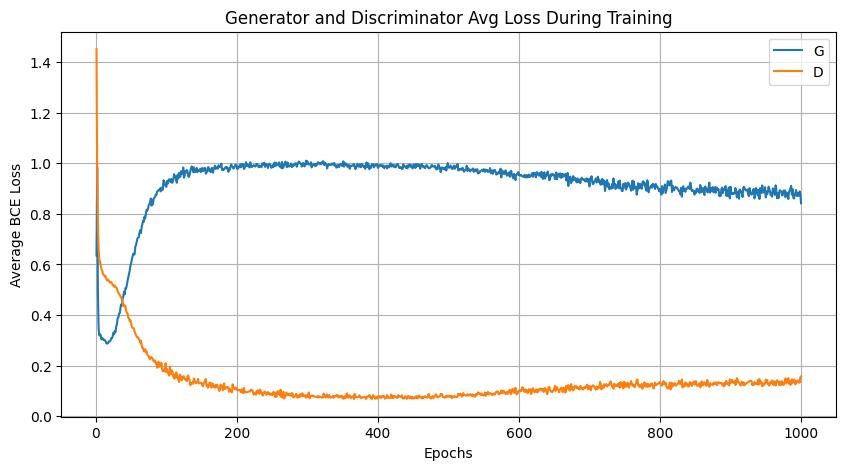

📉 Loss curve plot saved/shown (based on 1000 epochs).

Loading final Generator model and fixed preview data...
Generator loaded successfully.
Skipping Real vs Fake plot due to missing loaded components (model or fixed data).


In [ ]:
#  Visualization
N_COMPONENTS = 256
nz = 100
IMAGE_SIZE = 64


OUTPUT_BASE_DIR = '/content/drive/MyDrive/DNN experiments/Self-Attentioin' # <--- Point to the correct folder!
PREVIEW_DIR_CDCGAN = os.path.join(OUTPUT_BASE_DIR, 'previews')
CHECKPOINT_DIR_CDCGAN = os.path.join(OUTPUT_BASE_DIR, 'checkpoints')
LOSS_CURVE_G_PATH = os.path.join(OUTPUT_BASE_DIR, 'g_losses.npy')
LOSS_CURVE_D_PATH = os.path.join(OUTPUT_BASE_DIR, 'd_losses.npy')
FINAL_CKPT_G_PATH = os.path.join(CHECKPOINT_DIR_CDCGAN, 'netG_final.pth')

FIXED_NOISE_PATH = os.path.join(OUTPUT_BASE_DIR, 'fixed_noise.pt')
FIXED_FMRI_PATH = os.path.join(OUTPUT_BASE_DIR, 'fixed_fmri_condition.pt')
REAL_IMAGES_PREVIEW_PATH = os.path.join(OUTPUT_BASE_DIR, 'real_images_preview.pt')

REAL_SAMPLES_PNG_PATH = os.path.join(OUTPUT_BASE_DIR, 'real_samples_for_preview.png')


if not os.path.exists(OUTPUT_BASE_DIR):
    print(f"ERROR: Output directory {OUTPUT_BASE_DIR} not found. Cannot visualize results.")
else:
    print("Loading and plotting loss curves...")
    try:
        g_losses_loaded = np.load(LOSS_CURVE_G_PATH)
        d_losses_loaded = np.load(LOSS_CURVE_D_PATH)
        epochs_run = len(g_losses_loaded)
        plt.figure(figsize=(10,5))
        plt.title("Generator and Discriminator Avg Loss During Training")
        plt.plot(range(1, epochs_run + 1), g_losses_loaded, label="G")
        plt.plot(range(1, epochs_run + 1), d_losses_loaded, label="D")
        plt.xlabel("Epochs")
        plt.ylabel("Average BCE Loss")
        plt.legend()
        plt.grid(True)
        plt.savefig(os.path.join(OUTPUT_BASE_DIR, 'loss_curve_epochs_loaded.png'))
        plt.show()
        print(f"📉 Loss curve plot saved/shown (based on {epochs_run} epochs).")
    except FileNotFoundError:
        print("Loss curve files (.npy) not found. Skipping plot.")
    except Exception as e:
        print(f"Error plotting loss curves: {e}")

    print("\nLoading final Generator model and fixed preview data...")
    fixed_noise = None
    fixed_fmri_condition = None
    real_images_for_preview = None
    netG_loaded = None

    try:
        if os.path.exists(FIXED_NOISE_PATH):
            fixed_noise = torch.load(FIXED_NOISE_PATH, map_location=device)
            print(f"Loaded fixed_noise shape: {fixed_noise.shape}")
        else:
            print(f"Warning: Saved fixed noise not found at {FIXED_NOISE_PATH}")

        if os.path.exists(FIXED_FMRI_PATH):
            fixed_fmri_condition = torch.load(FIXED_FMRI_PATH, map_location=device)
            print(f"Loaded fixed_fmri_condition shape: {fixed_fmri_condition.shape}")
        else:
            print(f"Warning: Saved fixed fmri condition not found at {FIXED_FMRI_PATH}")

        if os.path.exists(REAL_IMAGES_PREVIEW_PATH):
             real_images_for_preview = torch.load(REAL_IMAGES_PREVIEW_PATH, map_location='cpu')
             print(f"Loaded real_images_for_preview shape: {real_images_for_preview.shape}")
        else:
            print(f"Warning: Saved real images tensor not found at {REAL_IMAGES_PREVIEW_PATH}")

        if 'Generator' not in locals():

             try:
                 class Generator(nn.Module):
                     def __init__(self):
                         super(Generator, self).__init__()
                         self.fMRI_embed = nn.Linear(fMRI_dim, embedding_dim)
                         combined_input_dim = nz + embedding_dim
                         self.main = nn.Sequential(
                             nn.ConvTranspose2d(combined_input_dim, ngf * 8, 4, 1, 0, bias=False), nn.BatchNorm2d(ngf * 8), nn.ReLU(True),
                             nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False), nn.BatchNorm2d(ngf * 4), nn.ReLU(True),
                             nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False), nn.BatchNorm2d(ngf * 2), nn.ReLU(True),
                             nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False), nn.BatchNorm2d(ngf), nn.ReLU(True),
                             nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False), nn.Tanh())
                     def forward(self, noise, fmri_condition):
                         fmri_embedded = self.fMRI_embed(fmri_condition)
                         gen_input = torch.cat((noise, fmri_embedded), 1)
                         gen_input_reshaped = gen_input.unsqueeze(-1).unsqueeze(-1)
                         return self.main(gen_input_reshaped)
                 embedding_dim = 128; nc=3; ngf=64; fMRI_dim=N_COMPONENTS # Example values
             except NameError:
                  raise NameError("Generator class or its parameters not defined. Please run Cell 4 first.")


        netG_loaded = Generator().to(device)
        netG_loaded.load_state_dict(torch.load(FINAL_CKPT_G_PATH, map_location=device))
        netG_loaded.eval()
        print("Generator loaded successfully.")

        # --- Generate and Plot ---
        if netG_loaded is not None and fixed_noise is not None and fixed_fmri_condition is not None and real_images_for_preview is not None:
            print("Generating fake images for comparison...")
            with torch.no_grad():
                fake_preview = netG_loaded(fixed_noise, fixed_fmri_condition).detach().cpu()

            print("Plotting Real vs. Final Fake images...")
            fig, axes = plt.subplots(1, 2, figsize=(10, 5))

            axes[0].axis("off")
            axes[0].set_title("Real Images (Fixed Condition)")
            axes[0].imshow(np.transpose(vutils.make_grid(real_images_for_preview.to('cpu'), # Ensure on CPU
                                                          padding=2, normalize=True).cpu(),(1,2,0)))

            axes[1].axis("off")
            axes[1].set_title(f"Fake Images (Epoch {epochs_run})") # Use loaded epoch count
            axes[1].imshow(np.transpose(vutils.make_grid(fake_preview, padding=2, normalize=True).cpu(),(1,2,0)))

            plt.tight_layout()
            plt.savefig(os.path.join(OUTPUT_BASE_DIR, 'real_vs_fake_final_comparison_loaded.png'))
            print("📊 Real vs. Fake comparison plot saved/shown.")
            plt.show()
        else:
             print("Skipping Real vs Fake plot due to missing loaded components (model or fixed data).")

    except FileNotFoundError as e:
        print(f"Error: Required file not found: {e}. Skipping relevant visualization part.")
    except NameError as e:
         print(f"Error loading model/data: {e}. Ensure relevant definition cells were run.")
    except Exception as e:
        print(f"An error occurred during model loading or image generation: {e}")

In [ ]:
PREVIEW_DIR_CDCGAN = '/content/drive/MyDrive/DNN experiments/Self-Attentioin/previews'
OUTPUT_BASE_DIR = '/content'
preview_files = sorted(glob.glob(os.path.join(PREVIEW_DIR_CDCGAN, 'preview_epoch_*.png')))
preview_files.sort(key=lambda f: int(re.search(r'preview_epoch_(\d+).png', f).group(1)))
print(preview_files)

if preview_files:
    gif_path = os.path.join(OUTPUT_BASE_DIR, 'training_progress_generation.gif')
    print(f"Creating GIF (saving to {gif_path})...")

    with imageio.get_writer(gif_path, mode='I', duration=0.5, loop=0) as writer:
        for filename in preview_files:
            image = imageio.v2.imread(filename)
            writer.append_data(image)
    print("GIF creation complete.")
else:
    print("No preview image files found in specified directory. Skipping GIF creation.")


['/content/drive/MyDrive/DNN experiments/Self-Attentioin/previews/preview_epoch_20.png', '/content/drive/MyDrive/DNN experiments/Self-Attentioin/previews/preview_epoch_40.png', '/content/drive/MyDrive/DNN experiments/Self-Attentioin/previews/preview_epoch_60.png', '/content/drive/MyDrive/DNN experiments/Self-Attentioin/previews/preview_epoch_80.png', '/content/drive/MyDrive/DNN experiments/Self-Attentioin/previews/preview_epoch_100.png', '/content/drive/MyDrive/DNN experiments/Self-Attentioin/previews/preview_epoch_120.png', '/content/drive/MyDrive/DNN experiments/Self-Attentioin/previews/preview_epoch_140.png', '/content/drive/MyDrive/DNN experiments/Self-Attentioin/previews/preview_epoch_160.png', '/content/drive/MyDrive/DNN experiments/Self-Attentioin/previews/preview_epoch_180.png', '/content/drive/MyDrive/DNN experiments/Self-Attentioin/previews/preview_epoch_200.png', '/content/drive/MyDrive/DNN experiments/Self-Attentioin/previews/preview_epoch_220.png', '/content/drive/MyDrive/

Using device: cuda:0
Loading PCA fMRI data from: /content/drive/MyDrive/DNN experiments/Self-Attentioin/cdcgan_pca_whole_hemi/fmri_pca_256.npy
Loaded fMRI PCA components shape: (9841, 256)
Selected random sample index: 3399
Loading real image for index: 3399
Loading Generator checkpoint from: /content/drive/MyDrive/DNN experiments/Self-Attentioin/checkpoints/netG_final.pth
Generator model loaded successfully.
Generating image from fMRI condition...
Image generation complete.

Displaying Real vs. Generated Image...


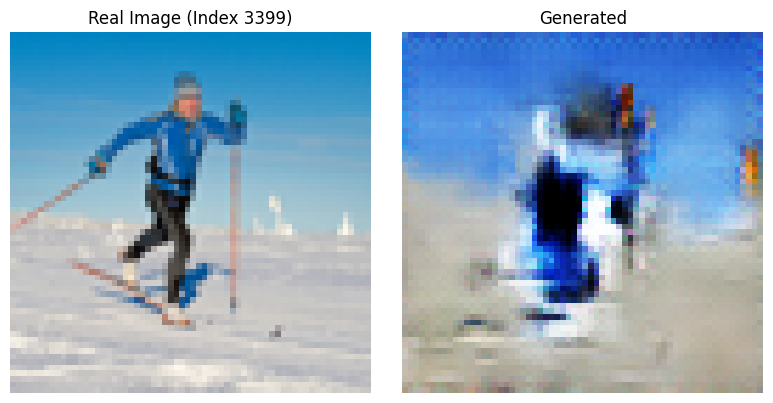

In [ ]:
TARGET_SUBJECT = 1
TARGET_HEMISPHERE = 'left'
N_COMPONENTS = 256
nz = 100
IMAGE_SIZE = 64


PCA_SAVE_DIR = '/content/drive/MyDrive/DNN experiments/Self-Attentioin/cdcgan_pca_whole_hemi'
FMRI_LATENT_PATH = os.path.join(PCA_SAVE_DIR, f'fmri_pca_{N_COMPONENTS}.npy')

CHECKPOINT = '/content/drive/MyDrive/DNN experiments/Self-Attentioin/checkpoints'
CHECKPOINT_EPOCH = 900
GENERATOR_CKPT_PATH = os.path.join(CHECKPOINT, 'netG_final.pth')

netG_loaded = None
fmri_pca_all = None
real_image_pil = None
generated_image_tensor = None

try:

    print(f"Loading PCA fMRI data from: {FMRI_LATENT_PATH}")
    if not os.path.exists(FMRI_LATENT_PATH):
        raise FileNotFoundError(f"PCA fMRI data not found at {FMRI_LATENT_PATH}. Please run Cell 3 for the 12 ROI setup.")
    fmri_pca_all = np.load(FMRI_LATENT_PATH)
    num_total_samples = fmri_pca_all.shape[0]
    print(f"Loaded fMRI PCA components shape: {fmri_pca_all.shape}")

    random_idx = random.randint(0, num_total_samples - 1)
    print(f"Selected random sample index: {random_idx}")

    fmri_condition_np = fmri_pca_all[random_idx]
    fmri_condition = torch.from_numpy(fmri_condition_np).float().unsqueeze(0).to(device)

    print(f"Loading real image for index: {random_idx}")
    real_image_pil = load_image_subject(TARGET_SUBJECT, random_idx, directory=root_dir)
    if real_image_pil is None:
        raise ValueError(f"Failed to load real image for index {random_idx}")

    print(f"Loading Generator checkpoint from: {GENERATOR_CKPT_PATH}")
    if not os.path.exists(GENERATOR_CKPT_PATH):
        raise FileNotFoundError(f"Generator checkpoint not found at {GENERATOR_CKPT_PATH}")

    if 'Generator' not in locals():
         raise NameError("Generator class not defined. Please ensure Cell 4 was executed.")
    try:
        embedding_dim = 128; nc=3; ngf=64; fMRI_dim=N_COMPONENTS
    except NameError:
        raise NameError("Required parameters (N_COMPONENTS, nz, etc.) not defined.")


    netG_loaded = Generator().to(device)
    netG_loaded.load_state_dict(torch.load(GENERATOR_CKPT_PATH, map_location=device))
    netG_loaded.eval() # Set to evaluation mode
    print("Generator model loaded successfully.")

    # Generate Image
    print("Generating image from fMRI condition...")
    noise = torch.randn(1, nz, device=device) # Generate noise for a single image
    with torch.no_grad():
        generated_image_tensor = netG_loaded(noise, fmri_condition).detach().cpu() # Shape: [1, 3, 64, 64]

    print("Image generation complete.")

except FileNotFoundError as e:
    print(f"ERROR: Required file not found. {e}")
except NameError as e:
    print(f"ERROR: A required variable or class is not defined. {e}")
except ValueError as e:
    print(f"ERROR: {e}")
except Exception as e:
    print(f"An unexpected error occurred: {e}")


if real_image_pil is not None and generated_image_tensor is not None:
    print("\nDisplaying Real vs. Generated Image...")
    fig, axes = plt.subplots(1, 2, figsize=(8, 4))

    axes[0].imshow(real_image_pil.resize((64, 64)))
    axes[0].set_title(f"Real Image (Index {random_idx})")
    axes[0].axis('off')

    img_display = (generated_image_tensor[0] * 0.5 + 0.5).clamp(0, 1)
    axes[1].set_title(f"Generated")
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("\nCould not display images due to errors during loading or generation.")